In [ ]:
from google.colab import drive

drive.mount("/content/drive")

Mounted at /content/drive


In [ ]:
!pip install -q ultralytics pandas

In [ ]:
from pathlib import Path
import random
import shutil

import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from ultralytics import YOLO

Creating new Ultralytics Settings v0.0.8 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/usage/settings.


In [ ]:
DRIVE_ROOT = Path("/content/drive/MyDrive/RCS")

ORIGINAL_ROOT = DRIVE_ROOT / "original"

ORIGINAL_A = ORIGINAL_ROOT / "A"
ORIGINAL_H = ORIGINAL_ROOT / "H"

BOOTSTRAP_ROOT = DRIVE_ROOT / "bootstrap_dataset"

BOOTSTRAP_IMAGES = (BOOTSTRAP_ROOT /"images_to_annotate")


BOOTSTRAP_LABELLED_IMAGES = (BOOTSTRAP_ROOT / "labelled" / "images")

BOOTSTRAP_LABELS = (BOOTSTRAP_ROOT / "labelled" / "labels")

#First dataset

FIRST_DATASET = (DRIVE_ROOT / "first_model_dataset")

FIRST_TRAIN_IMAGES = (FIRST_DATASET / "images" / "train")

FIRST_VAL_IMAGES = ( FIRST_DATASET / "images" / "val")

FIRST_TRAIN_LABELS = (FIRST_DATASET / "labels" / "train")

FIRST_VAL_LABELS = (FIRST_DATASET / "labels" / "val")

FIRST_YAML = (FIRST_DATASET / "dataset.yaml")

#First Model

FIRST_RUNS = (DRIVE_ROOT / "first_model_runs")

FIRST_MODEL_FOLDER = (DRIVE_ROOT / "first_model")

#Auto-Label

AUTO_ROOT = (DRIVE_ROOT / "auto_labels")

AUTO_IMAGES = (AUTO_ROOT / "images")

AUTO_LABELS = (AUTO_ROOT / "labels")

AUTO_REVIEW = (AUTO_ROOT / "review")

#Final Dataset

FINAL_DATASET = (DRIVE_ROOT / "final_dataset")

FINAL_TRAIN_IMAGES = (FINAL_DATASET / "images" / "train")

FINAL_VAL_IMAGES = (FINAL_DATASET / "images" / "val")

FINAL_TRAIN_LABELS = (FINAL_DATASET / "labels" / "train")

FINAL_VAL_LABELS = (FINAL_DATASET / "labels" / "val")

FINAL_YAML = (FINAL_DATASET / "dataset.yaml")

#Final Model

FINAL_RUNS = (DRIVE_ROOT / "final_runs")

FINAL_MODEL_FOLDER = (DRIVE_ROOT / "final_model")

#Final crops from pond A

A_OUTPUT = (DRIVE_ROOT / "A_POND_BELLY_OUTPUT")

A_PREDICTIONS = (A_OUTPUT / "predictions")

A_MASKS = (A_OUTPUT / "masks")

A_BELLIES = (A_OUTPUT / "belly_crops")

A_TRANSPARENT = (A_OUTPUT / "belly_transparent")

FINAL_BELLY_FOLDER = (DRIVE_ROOT / "A_POND_BELLIES_FINAL")

folders = [
    BOOTSTRAP_IMAGES,
    BOOTSTRAP_LABELLED_IMAGES,
    BOOTSTRAP_LABELS,

    FIRST_TRAIN_IMAGES,
    FIRST_VAL_IMAGES,
    FIRST_TRAIN_LABELS,
    FIRST_VAL_LABELS,

    FIRST_RUNS,
    FIRST_MODEL_FOLDER,

    AUTO_IMAGES,
    AUTO_LABELS,
    AUTO_REVIEW,

    FINAL_TRAIN_IMAGES,
    FINAL_VAL_IMAGES,
    FINAL_TRAIN_LABELS,
    FINAL_VAL_LABELS,

    FINAL_RUNS,
    FINAL_MODEL_FOLDER,

    A_PREDICTIONS,
    A_MASKS,
    A_BELLIES,
    A_TRANSPARENT,

    FINAL_BELLY_FOLDER
]

for folder in folders:
    folder.mkdir(parents=True, exist_ok=True)
print("✅ Folders ready")

✅ Folders ready


In [ ]:
#i
IMAGE_EXTENSIONS = {".jpg", ".jpeg"}

def get_images(folder):
    folder = Path(folder)
    if not folder.exists():
        return []

    return sorted([
        file
        for file in folder.iterdir()
        if file.is_file()
        and file.suffix.lower() in IMAGE_EXTENSIONS
    ])

In [ ]:
#original images
a_images = get_images(ORIGINAL_A)

h_images = get_images(ORIGINAL_H)

print("A:", len(a_images))
print("H:", len(h_images))
print("Total:", len(a_images) + len(h_images))

A: 0
H: 0
Total: 0


In [ ]:
#select bootstrap images: 50 from A, 50 from H
SEED = 42

rng = random.Random(SEED)

a_bootstrap = rng.sample(a_images, 50)

h_bootstrap = rng.sample(h_images, 50)

bootstrap_images = (a_bootstrap + h_bootstrap)

print("Selected:", len(bootstrap_images))

Selected: 100


In [ ]:
#copy the images to annotation folder
for source in a_bootstrap:
    destination = (BOOTSTRAP_IMAGES / f"APOND_{source.name}")
    shutil.copy2(source, destination)

for source in h_bootstrap:
    destination = (BOOTSTRAP_IMAGES / f"HPOND_{source.name}")
    shutil.copy2(source, destination)

print("Images to annotate:", len(get_images(BOOTSTRAP_IMAGES)))

Images to annotate: 100


In [ ]:
#
from pathlib import Path
import zipfile
import shutil

CVAT_ZIP = DRIVE_ROOT / "crop.zip"
CVAT_EXTRACT = DRIVE_ROOT / "crop_extracted"

# Start with a clean extraction folder
if CVAT_EXTRACT.exists():
    shutil.rmtree(CVAT_EXTRACT)

CVAT_EXTRACT.mkdir(parents=True, exist_ok=True)

with zipfile.ZipFile(CVAT_ZIP, "r") as z:
    z.extractall(CVAT_EXTRACT)

print("✅ CVAT ZIP extracted")
print()

for p in sorted(CVAT_EXTRACT.rglob("*")):
    if p.is_file():
        print(p.relative_to(CVAT_EXTRACT))

✅ CVAT ZIP extracted

data.yaml
labels/train/APOND_A01_05_03_W_roh.txt
labels/train/APOND_A01_15_01_W_roh.txt
labels/train/APOND_A01_15_03_W_roh.txt
labels/train/APOND_A01_15_06_W_roh.txt
labels/train/APOND_A01_18_01_W_roh.txt
labels/train/APOND_A02_06_04_M_roh.txt
labels/train/APOND_A02_06_06_M_roh.txt
labels/train/APOND_A02_06_07_M_roh.txt
labels/train/APOND_A03_12_01_M_roh.txt
labels/train/APOND_A03_12_03_M_roh.txt
labels/train/APOND_A04_06_02_M_roh.txt
labels/train/APOND_A04_15_04_M_roh.txt
labels/train/APOND_A04_15_05_W_roh.txt
labels/train/APOND_A05_18_08_W_roh.txt
labels/train/APOND_A06_12_01_W_roh.txt
labels/train/APOND_A06_12_04_W_roh.txt
labels/train/APOND_A06_14_02_W_roh.txt
labels/train/APOND_A06_15_03_W_roh.txt
labels/train/APOND_A06_17_04_W_roh.txt
labels/train/APOND_A07_09_03_W_roh.txt
labels/train/APOND_A07_17_06_W_roh.txt
labels/train/APOND_A07_18_01_W_roh.txt
labels/train/APOND_A08_15_07_W_roh.txt
labels/train/APOND_A08_15_14_W_roh.txt
labels/train/APOND_A08_15_17_M_r

In [ ]:
from pathlib import Path
import shutil

# Exact CVAT label folder
CVAT_LABELS = CVAT_EXTRACT / "labels" / "train"

# Find all polygon labels
label_files = sorted(CVAT_LABELS.glob("*.txt"))

print("CVAT label folder:", CVAT_LABELS)
print("Folder exists:", CVAT_LABELS.exists())
print("Number of polygon labels:", len(label_files))

print("\nFirst 5 labels:")
for p in label_files[:5]:
    print(p.name)

CVAT label folder: /content/drive/MyDrive/RCS/crop_extracted/labels/train
Folder exists: True
Number of polygon labels: 100

First 5 labels:
APOND_A01_05_03_W_roh.txt
APOND_A01_15_01_W_roh.txt
APOND_A01_15_03_W_roh.txt
APOND_A01_15_06_W_roh.txt
APOND_A01_18_01_W_roh.txt


In [ ]:
for label_path in label_files[:5]:

    print("\nFILE:", label_path.name)

    text = label_path.read_text().strip()

    print(text[:500])


FILE: APOND_A01_05_03_W_roh.txt
0 0.477700 0.606714 0.461904 0.662983 0.466841 0.700493 0.485596 0.766631 0.572461 0.801182 0.659331 0.787358 0.688945 0.748862 0.704736 0.688647 0.700791 0.617573 0.583320 0.591909 0.580361 0.589937

FILE: APOND_A01_15_01_W_roh.txt
0 0.424180 0.562637 0.361003 0.588896 0.358724 0.635703 0.370898 0.675098 0.419609 0.693936 0.479740 0.701924 0.549766 0.703066 0.584023 0.692793 0.587070 0.665391 0.596966 0.640273 0.596966 0.617441 0.588594 0.589463 0.544440 0.565488 0.491159 0.556924

FILE: APOND_A01_15_03_W_roh.txt
0 0.144271 0.620332 0.142891 0.650342 0.166354 0.689678 0.206380 0.703652 0.242266 0.705723 0.283672 0.697441 0.316797 0.685537 0.329909 0.661729 0.336120 0.626543 0.301615 0.606875 0.245716 0.594453 0.187747 0.597559

FILE: APOND_A01_15_06_W_roh.txt
0 0.261628 0.665498 0.247096 0.705254 0.254792 0.746934 0.306081 0.771299 0.365924 0.778984 0.425768 0.767451 0.457409 0.736670 0.467656 0.703330 0.444583 0.683457 0.399271 0.660371 0.320612 0.653

In [ ]:
print("Annotation images:", len(get_images(BOOTSTRAP_IMAGES)))

Annotation images: 100


In [ ]:
bootstrap_images = get_images(BOOTSTRAP_IMAGES)

image_stems = {p.stem for p in bootstrap_images}
label_stems = {p.stem for p in label_files}

matched = image_stems & label_stems
missing = image_stems - label_stems
extra = label_stems - image_stems

print("Bootstrap images:", len(bootstrap_images))
print("CVAT labels:", len(label_files))
print("Matched:", len(matched))
print("Images missing labels:", len(missing))
print("Extra labels:", len(extra))

if missing:
    print("\nMissing examples:")
    for x in sorted(missing)[:10]:
        print(x)

if extra:
    print("\nExtra examples:")
    for x in sorted(extra)[:10]:
        print(x)

Bootstrap images: 100
CVAT labels: 100
Matched: 100
Images missing labels: 0
Extra labels: 0


In [ ]:
for p in sorted(CVAT_EXTRACT.rglob("*")):
    print(p.relative_to(CVAT_EXTRACT))

data.yaml
labels
labels/train
labels/train/APOND_A01_05_03_W_roh.txt
labels/train/APOND_A01_15_01_W_roh.txt
labels/train/APOND_A01_15_03_W_roh.txt
labels/train/APOND_A01_15_06_W_roh.txt
labels/train/APOND_A01_18_01_W_roh.txt
labels/train/APOND_A02_06_04_M_roh.txt
labels/train/APOND_A02_06_06_M_roh.txt
labels/train/APOND_A02_06_07_M_roh.txt
labels/train/APOND_A03_12_01_M_roh.txt
labels/train/APOND_A03_12_03_M_roh.txt
labels/train/APOND_A04_06_02_M_roh.txt
labels/train/APOND_A04_15_04_M_roh.txt
labels/train/APOND_A04_15_05_W_roh.txt
labels/train/APOND_A05_18_08_W_roh.txt
labels/train/APOND_A06_12_01_W_roh.txt
labels/train/APOND_A06_12_04_W_roh.txt
labels/train/APOND_A06_14_02_W_roh.txt
labels/train/APOND_A06_15_03_W_roh.txt
labels/train/APOND_A06_17_04_W_roh.txt
labels/train/APOND_A07_09_03_W_roh.txt
labels/train/APOND_A07_17_06_W_roh.txt
labels/train/APOND_A07_18_01_W_roh.txt
labels/train/APOND_A08_15_07_W_roh.txt
labels/train/APOND_A08_15_14_W_roh.txt
labels/train/APOND_A08_15_17_M_roh

In [ ]:
# Clean generated labelled folders only.
# This does NOT delete your original A/H images or CVAT export.

if BOOTSTRAP_LABELLED_IMAGES.exists():
    shutil.rmtree(BOOTSTRAP_LABELLED_IMAGES)

if BOOTSTRAP_LABELS.exists():
    shutil.rmtree(BOOTSTRAP_LABELS)

BOOTSTRAP_LABELLED_IMAGES.mkdir(parents=True, exist_ok=True)
BOOTSTRAP_LABELS.mkdir(parents=True, exist_ok=True)


# Copy the 100 images
for image_path in bootstrap_images:
    shutil.copy2(
        image_path,
        BOOTSTRAP_LABELLED_IMAGES / image_path.name
    )


# Copy the 100 CVAT polygon labels
for label_path in label_files:
    shutil.copy2(
        label_path,
        BOOTSTRAP_LABELS / label_path.name
    )


print(
    "Images copied:",
    len(get_images(BOOTSTRAP_LABELLED_IMAGES))
)

print(
    "Labels copied:",
    len(list(BOOTSTRAP_LABELS.glob("*.txt")))
)

Images copied: 100
Labels copied: 100


In [ ]:
bootstrap_images = get_images(BOOTSTRAP_IMAGES)

print("Bootstrap images:", len(bootstrap_images))
print("CVAT labels:", len(label_files))

Bootstrap images: 100
CVAT labels: 100


In [ ]:
labelled_images=get_images(BOOTSTRAP_LABELLED_IMAGES)

In [ ]:
#check missing or extra labels
image_stems = {
    image.stem
    for image in labelled_images
}

label_stems = {
    label.stem
    for label in label_files
}

missing_labels = sorted(image_stems - label_stems)

extra_labels = sorted(label_stems - image_stems)

print("Missing:", image_stems)

print("Extra labels:", len(extra_labels))

print("Missing:", missing_labels[:10])

Missing labels: 0
Extra labels: 0
Missing: []


In [ ]:
#txt files
def validate_polygon_file(label_path):
    errors = []
    with open(label_path, "r") as file:
        lines = file.readlines()

    if len(lines) == 0:
        return ["empty label"]

    for line_number, line in enumerate(lines, start=1):
        values = (line.strip().split())

        if len(values) < 7:
            errors.append(f"line {line_number}: too few values")
            continue

        try:
            class_id = int(values[0])

            coordinates = [
                float(value)
                for value in values[1:]
            ]

        except ValueError:
            errors.append(f"line {line_number}: invalid number")

            continue

        if class_id != 0:
            errors.append(f"line {line_number}: class should be 0")

        if len(coordinates) % 2 != 0:
            errors.append(f"line {line_number}: odd coordinate count")

        if any(
            value < 0
            or value > 1
            for value in coordinates
        ):
            errors.append(f"line {line_number}: coordinate outside 0-1")

    return errors

In [ ]:
bad_labels = []

for label_path in label_files:

    errors = validate_polygon_file(
        label_path
    )

    if errors:

        bad_labels.append(
            (
                label_path.name,
                errors
            )
        )

print(
    "Bad labels:",
    len(bad_labels)
)


bad_labels[:10]

Bad labels: 0


[]

In [ ]:
pairs = []


for image_path in labelled_images:

    label_path = (
        BOOTSTRAP_LABELS /
        f"{image_path.stem}.txt"
    )

    if label_path.exists():

        pairs.append(
            (
                image_path,
                label_path
            )
        )


rng = random.Random(
    SEED
)

rng.shuffle(
    pairs
)


val_count = 20


val_pairs = (
    pairs[:val_count]
)


train_pairs = (
    pairs[val_count:]
)


print(
    "Train:",
    len(train_pairs)
)

print(
    "Validation:",
    len(val_pairs)
)

Train: 80
Validation: 20


In [ ]:
def copy_pairs(
    pairs,
    image_destination,
    label_destination
):

    for image_path, label_path in pairs:

        shutil.copy2(
            image_path,
            image_destination /
            image_path.name
        )

        shutil.copy2(
            label_path,
            label_destination /
            label_path.name
        )

In [ ]:
copy_pairs(
    train_pairs,
    FIRST_TRAIN_IMAGES,
    FIRST_TRAIN_LABELS
)


copy_pairs(
    val_pairs,
    FIRST_VAL_IMAGES,
    FIRST_VAL_LABELS
)

In [ ]:
yaml_text = f"""
path: {FIRST_DATASET}

train: images/train
val: images/val

names:
  0: toad_belly
"""


with open(
    FIRST_YAML,
    "w"
) as file:

    file.write(
        yaml_text.strip()
    )


print(
    FIRST_YAML.read_text()
)

path: /content/drive/MyDrive/RCS/first_model_dataset

train: images/train
val: images/val

names:
  0: toad_belly


In [ ]:
model = YOLO(
    "yolo26n-seg.pt"
)

In [ ]:
first_model = YOLO(
    "yolo26n-seg.pt"
)


first_results = first_model.train(

    data=str(
        FIRST_YAML
    ),

    epochs=100,

    imgsz=640,

    batch=8,

    patience=20,

    device=0,

    project=str(
        FIRST_RUNS
    ),

    name="belly_bootstrap",

    exist_ok=True
)

Ultralytics 8.4.137 🚀 Python-3.13.15 torch-2.11.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, channels_last=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, cls_remap=True, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/drive/MyDrive/RCS/first_model_dataset/dataset.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dgrad=0.5, dis=6.0, distill_model=None, dlam=1.0, dlog=1.0, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=100, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo26n-seg.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name

In [ ]:
FIRST_BEST = (

    Path(
        first_results.save_dir
    )

    /

    "weights"

    /

    "best.pt"
)


print(
    FIRST_BEST
)


assert FIRST_BEST.exists()


shutil.copy2(

    FIRST_BEST,

    FIRST_MODEL_FOLDER /
    "best.pt"
)

/content/drive/MyDrive/RCS/first_model_runs/belly_bootstrap/weights/best.pt


PosixPath('/content/drive/MyDrive/RCS/first_model/best.pt')

In [ ]:
first_model = YOLO(

    str(
        FIRST_MODEL_FOLDER /
        "best.pt"
    )
)


first_metrics = (
    first_model.val(

        data=str(
            FIRST_YAML
        ),

        split="val"
    )
)

Ultralytics 8.4.137 🚀 Python-3.13.15 torch-2.11.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
YOLO26n-seg summary (fused): 139 layers, 2,689,079 parameters, 0 gradients, 9.1 GFLOPs
val: Fast image access ✅ (ping: 2.6±3.4 ms, read: 88.7±47.6 MB/s, size: 205.3 KB)
val: Scanning /content/drive/MyDrive/RCS/first_model_dataset/labels/val.cache... 20 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 20/20 5.2Mit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 2/2 1.2s/it 2.5s
                   all         20         20      0.903       0.93      0.979      0.739      0.903       0.93      0.979      0.782
Speed: 10.0ms preprocess, 25.0ms inference, 0.0ms loss, 2.3ms postprocess per image
Results saved to /content/runs/segment/val


In [ ]:
print(
    "Mask precision:",
    first_metrics.seg.mp
)

print(
    "Mask recall:",
    first_metrics.seg.mr
)

print(
    "Mask mAP50:",
    first_metrics.seg.map50
)

print(
    "Mask mAP50-95:",
    first_metrics.seg.map
)

Mask precision: 0.9028843958312056
Mask recall: 0.9302861562276588
Mask mAP50: 0.9792731829573933
Mask mAP50-95: 0.7821865796210462


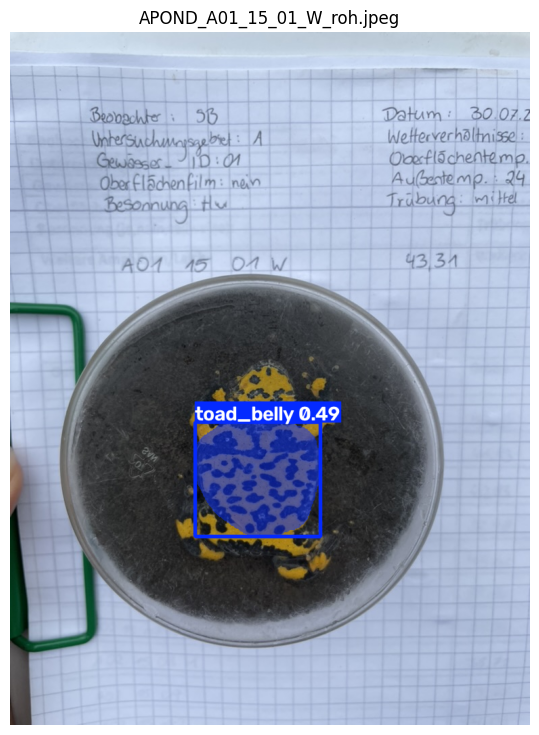

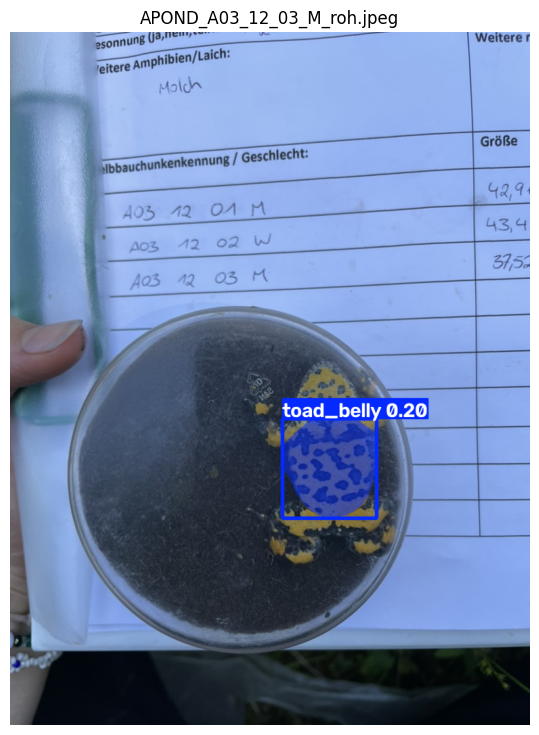

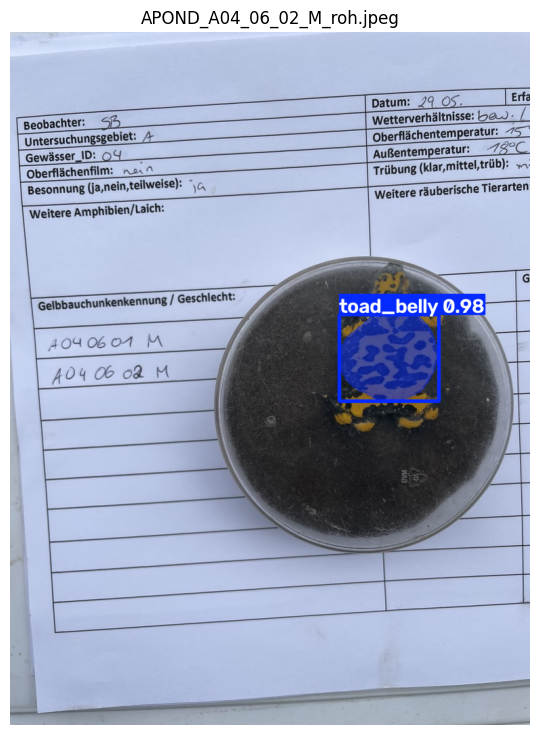

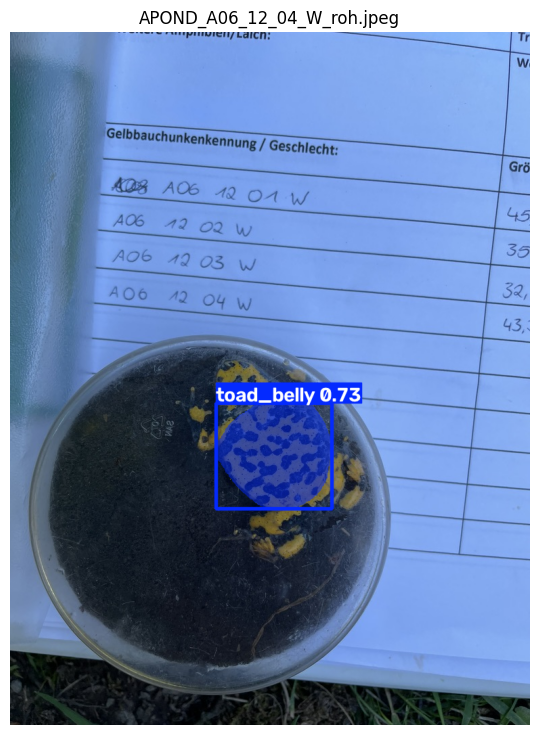

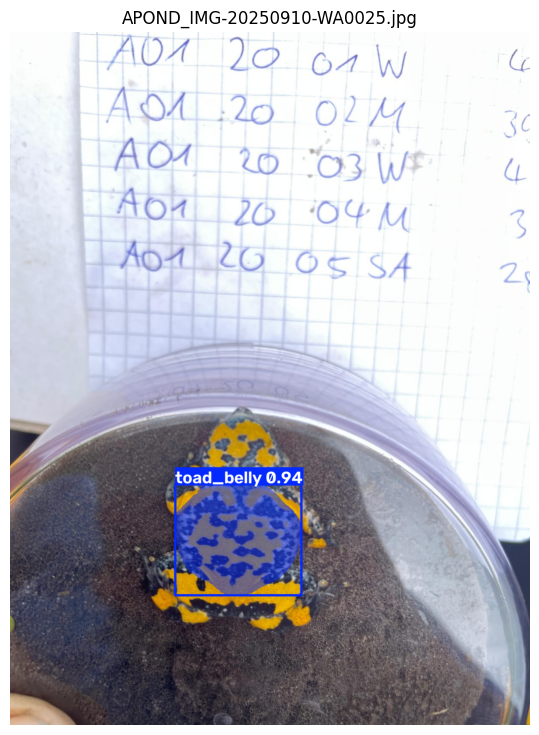

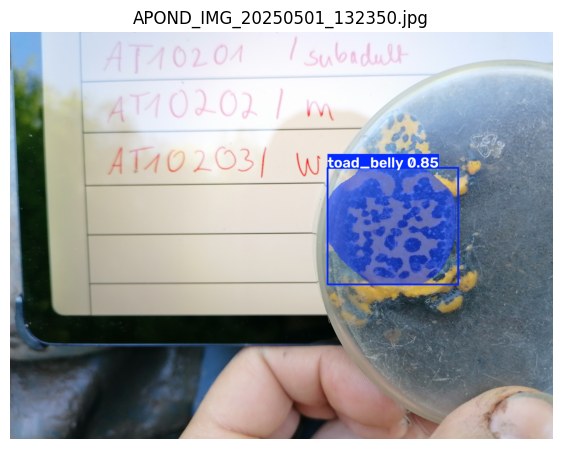

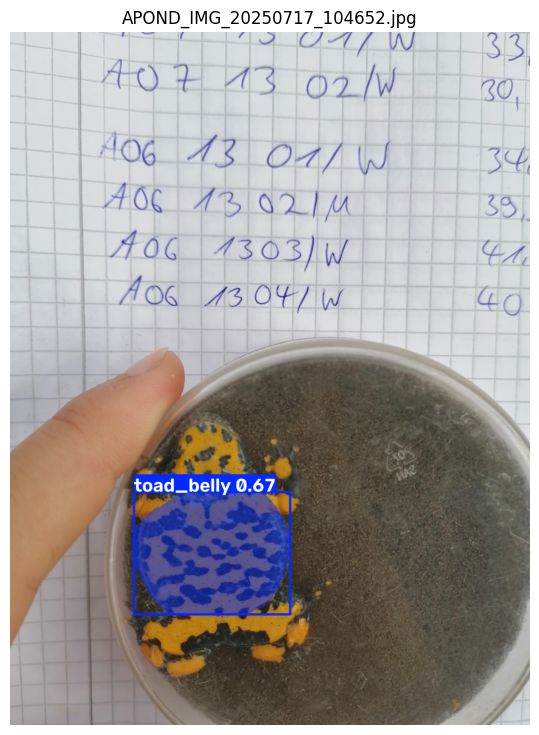

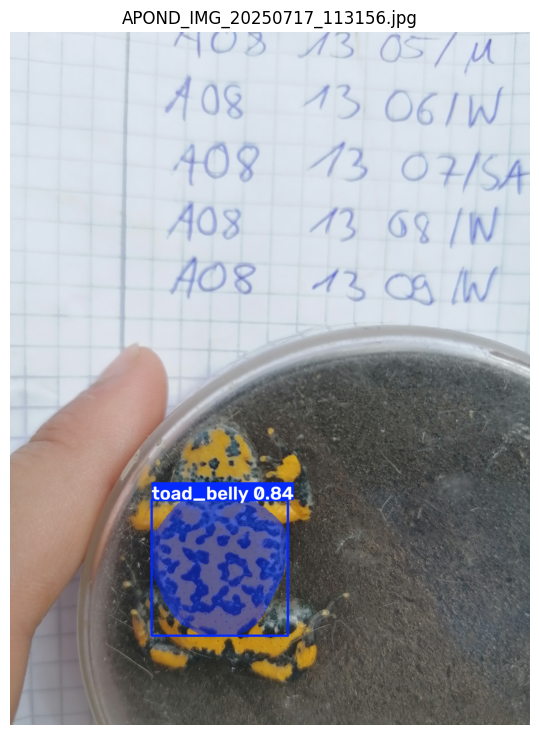

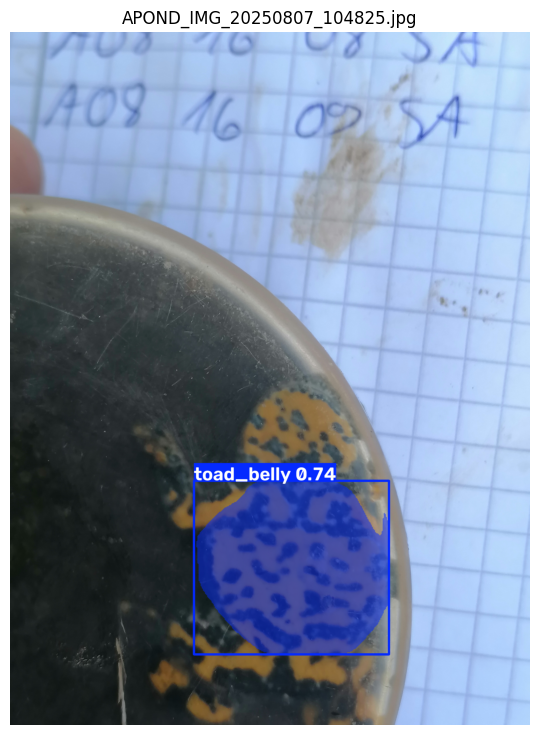

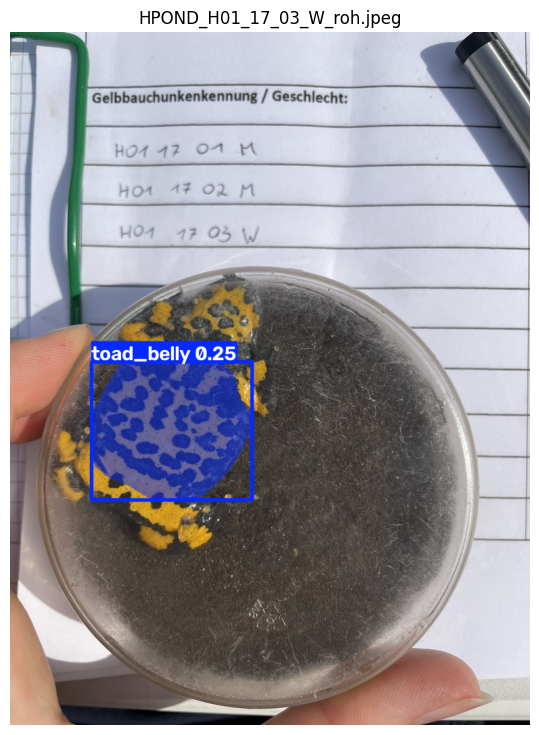

In [ ]:
sample_images = (
    get_images(
        FIRST_VAL_IMAGES
    )[:10]
)


for image_path in sample_images:

    result = first_model.predict(

        source=str(
            image_path
        ),

        conf=0.20,

        max_det=1,

        imgsz=640,

        verbose=False
    )[0]


    plotted = result.plot()


    plt.figure(
        figsize=(7, 9)
    )


    plt.imshow(

        cv2.cvtColor(

            plotted,

            cv2.COLOR_BGR2RGB
        )
    )


    plt.title(
        image_path.name
    )


    plt.axis(
        "off"
    )


    plt.show()

In [ ]:
selected_a_names = {
    image.name
    for image in a_bootstrap
}

selected_h_names = {
    image.name
    for image in h_bootstrap
}


remaining_a = [

    image
    for image in a_images

    if image.name
    not in selected_a_names
]


remaining_h = [

    image
    for image in h_images

    if image.name
    not in selected_h_names
]


print(
    "Remaining A:",
    len(remaining_a)
)

print(
    "Remaining H:",
    len(remaining_h)
)

print(
    "Total:",
    len(remaining_a)
    +
    len(remaining_h)
)

Remaining A: 149
Remaining H: 100
Total: 249


In [ ]:
for source in remaining_a:

    destination = (
        AUTO_IMAGES /
        f"APOND_{source.name}"
    )

    shutil.copy2(
        source,
        destination
    )


for source in remaining_h:

    destination = (
        AUTO_IMAGES /
        f"HPOND_{source.name}"
    )

    shutil.copy2(
        source,
        destination
    )


print(
    len(
        get_images(
            AUTO_IMAGES
        )
    )
)

249


In [ ]:
def auto_label_images(
    model,
    image_folder,
    label_folder,
    confidence=0.15
):

    images = get_images(
        image_folder
    )


    records = []


    for index, image_path in enumerate(
        images,
        start=1
    ):

        print(
            f"{index}/{len(images)} "
            f"{image_path.name}"
        )


        result = model.predict(

            source=str(
                image_path
            ),

            conf=confidence,

            iou=0.70,

            max_det=1,

            imgsz=640,

            verbose=False
        )[0]


        if (
            result.boxes is None
            or len(result.boxes) == 0
            or result.masks is None
        ):

            records.append({
                "image":
                    image_path.name,

                "status":
                    "NO_DETECTION",

                "confidence":
                    0
            })

            continue


        confidence_values = (
            result.boxes.conf
            .detach()
            .cpu()
            .numpy()
        )


        best_index = int(
            np.argmax(
                confidence_values
            )
        )


        polygon = (
            result.masks.xyn[
                best_index
            ]
        )


        if (
            polygon is None
            or len(polygon) < 3
        ):

            continue


        polygon = np.asarray(
            polygon,
            dtype=np.float32
        )


        polygon = np.clip(
            polygon,
            0,
            1
        )


        values = []


        for x, y in polygon:

            values.extend([
                float(x),
                float(y)
            ])


        label_line = (

            "0 "

            +

            " ".join(

                f"{value:.6f}"

                for value in values
            )
        )


        label_path = (

            Path(label_folder)

            /

            f"{image_path.stem}.txt"
        )


        with open(
            label_path,
            "w"
        ) as file:

            file.write(
                label_line +
                "\n"
            )


        records.append({

            "image":
                image_path.name,

            "status":
                "AUTO_LABELLED",

            "confidence":
                float(
                    confidence_values[
                        best_index
                    ]
                )
        })


    return pd.DataFrame(
        records
    )

In [ ]:
auto_report = auto_label_images(

    first_model,

    AUTO_IMAGES,

    AUTO_LABELS,

    confidence=0.15
)


auto_report.to_csv(

    AUTO_ROOT /
    "auto_label_report.csv",

    index=False
)


print(
    auto_report[
        "status"
    ].value_counts()
)

1/249 APOND_A01_03_07_W_roh.jpeg
2/249 APOND_A01_06_01_SA_roh.jpeg
3/249 APOND_A01_08_01_W_roh.jpg
4/249 APOND_A01_09_21_W_roh.jpg
5/249 APOND_A01_12_01_M_roh.jpeg
6/249 APOND_A01_15_07_W_roh.jpeg
7/249 APOND_A01_17_01_W_roh.jpg
8/249 APOND_A01_18_02_M_roh.jpeg
9/249 APOND_A01_18_03_W_roh.jpeg
10/249 APOND_A01_18_04_M_roh.jpeg
11/249 APOND_A01_18_05_W_roh.jpeg
12/249 APOND_A01_18_07_W_roh.jpeg
13/249 APOND_A01_18_12_M_roh.jpeg
14/249 APOND_A01_18_14_W_roh.jpeg
15/249 APOND_A02_03_01_W_roh.jpeg
16/249 APOND_A02_03_02_M_roh.jpeg
17/249 APOND_A02_06_03_M_roh.jpeg
18/249 APOND_A02_08_05_M_roh.jpg
19/249 APOND_A03_12_02_W_roh.jpeg
20/249 APOND_A03_15_04_W_roh.jpeg
21/249 APOND_A03_15_06_W_roh.jpeg
22/249 APOND_A03_18_06_W_roh.jpeg
23/249 APOND_A03_18_07_M_roh.jpeg
24/249 APOND_A04_03_01_W_roh.jpeg
25/249 APOND_A04_06_01_M_roh.jpeg
26/249 APOND_A04_12_02_M_roh.jpeg
27/249 APOND_A04_12_04_W_roh.jpeg
28/249 APOND_A04_15_03_M_roh.jpeg
29/249 APOND_A04_15_06_M_roh.jpeg
30/249 APOND_A04_17_01_W_r

In [ ]:
auto_report.sort_values(
    "confidence"
).head(30)

,image,status,confidence
111,APOND_IMG-20250829-WA0024.jpg,NO_DETECTION,0.000000
73,APOND_A08_18_10_W_roh.jpeg,NO_DETECTION,0.000000
72,APOND_A08_18_09_M_roh.jpeg,NO_DETECTION,0.000000
68,APOND_A08_18_03_W_roh.jpeg,NO_DETECTION,0.000000
205,HPOND_H11_19_01_W_roh.jpg,NO_DETECTION,0.000000
158,HPOND_H05_04_02_W_roh.jpeg,NO_DETECTION,0.000000
151,HPOND_H01_17_01_M_roh.jpeg,NO_DETECTION,0.000000
131,APOND_IMG_20250501_132115.jpg,NO_DETECTION,0.000000
199,HPOND_H11_07_02_M_roh.jpg,AUTO_LABELLED,0.166411
14,APOND_A02_03_01_W_roh.jpeg,AUTO_LABELLED,0.175039


In [ ]:
all_pairs = []


# -------------------------------------------
# Original 100
# -------------------------------------------

for image_path in get_images(
    BOOTSTRAP_LABELLED_IMAGES
):

    label_path = (

        BOOTSTRAP_LABELS

        /

        f"{image_path.stem}.txt"
    )

    if label_path.exists():

        all_pairs.append(
            (
                image_path,
                label_path
            )
        )


# -------------------------------------------
# Remaining 249
# -------------------------------------------

for image_path in get_images(
    AUTO_IMAGES
):

    label_path = (

        AUTO_LABELS

        /

        f"{image_path.stem}.txt"
    )

    if label_path.exists():

        all_pairs.append(
            (
                image_path,
                label_path
            )
        )


print(
    "Total labelled pairs:",
    len(all_pairs)
)

Total labelled pairs: 341


In [ ]:
rng = random.Random(
    100
)

rng.shuffle(
    all_pairs
)


FINAL_VAL_COUNT = 70


final_val_pairs = (
    all_pairs[
        :FINAL_VAL_COUNT
    ]
)


final_train_pairs = (
    all_pairs[
        FINAL_VAL_COUNT:
    ]
)


print(
    "Final train:",
    len(final_train_pairs)
)


print(
    "Final val:",
    len(final_val_pairs)
)

Final train: 271
Final val: 70


In [ ]:
copy_pairs(

    final_train_pairs,

    FINAL_TRAIN_IMAGES,

    FINAL_TRAIN_LABELS
)


copy_pairs(

    final_val_pairs,

    FINAL_VAL_IMAGES,

    FINAL_VAL_LABELS
)

In [ ]:
yaml_text = f"""
path: {FINAL_DATASET}

train: images/train
val: images/val

names:
  0: toad_belly
"""


with open(
    FINAL_YAML,
    "w"
) as file:

    file.write(
        yaml_text.strip()
    )


print(
    FINAL_YAML.read_text()
)

path: /content/drive/MyDrive/RCS/final_dataset

train: images/train
val: images/val

names:
  0: toad_belly


In [ ]:
final_model = YOLO(

    str(
        FIRST_MODEL_FOLDER /
        "best.pt"
    )
)


final_results = final_model.train(

    data=str(
        FINAL_YAML
    ),

    epochs=100,

    imgsz=640,

    batch=8,

    patience=20,

    device=0,

    project=str(
        FINAL_RUNS
    ),

    name="final_belly_model",

    exist_ok=True
)

Ultralytics 8.4.137 🚀 Python-3.13.15 torch-2.11.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, channels_last=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, cls_remap=True, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/drive/MyDrive/RCS/final_dataset/dataset.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dgrad=0.5, dis=6.0, distill_model=None, dlam=1.0, dlog=1.0, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=100, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=/content/drive/MyDrive/RCS/first_model/best.pt, momentum=0.937, mosaic=

In [ ]:
FINAL_BEST = (

    Path(
        final_results.save_dir
    )

    /

    "weights"

    /

    "best.pt"
)


assert FINAL_BEST.exists()


FINAL_MODEL_PATH = (

    FINAL_MODEL_FOLDER

    /

    "best.pt"
)


shutil.copy2(

    FINAL_BEST,

    FINAL_MODEL_PATH
)


print(
    FINAL_MODEL_PATH
)

NameError: name 'final_results' is not defined

In [ ]:
final_model = YOLO(
    str(
        FINAL_MODEL_PATH
    )
)


metrics = final_model.val(

    data=str(
        FINAL_YAML
    ),

    split="val"
)


print(
    "Mask Precision:",
    metrics.seg.mp
)

print(
    "Mask Recall:",
    metrics.seg.mr
)

print(
    "Mask mAP50:",
    metrics.seg.map50
)

print(
    "Mask mAP50-95:",
    metrics.seg.map
)

Ultralytics 8.4.137 🚀 Python-3.13.15 torch-2.11.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
YOLO26n-seg summary (fused): 139 layers, 2,689,079 parameters, 0 gradients, 9.1 GFLOPs
val: Fast image access ✅ (ping: 0.4±0.1 ms, read: 243.9±219.6 MB/s, size: 1190.0 KB)
val: Scanning /content/drive/MyDrive/RCS/final_dataset/labels/val.cache... 70 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 70/70 17.3Mit/s 0.0s
val: /content/drive/MyDrive/RCS/final_dataset/images/val/APOND_IMG_20250717_123430.jpg: corrupt JPEG restored and saved
val: /content/drive/MyDrive/RCS/final_dataset/images/val/APOND_IMG_20250807_104343.jpg: corrupt JPEG restored and saved
val: /content/drive/MyDrive/RCS/final_dataset/images/val/HPOND_IMG_20250501_133055.jpg: corrupt JPEG restored and saved
val: /content/drive/MyDrive/RCS/final_dataset/images/val/HPOND_IMG_20250501_133543.jpg: corrupt JPEG restored and saved
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R   

In [ ]:
best_models = sorted(
    DRIVE_ROOT.rglob("best.pt")
)

print("best.pt files found:", len(best_models))
print()

for i, model_path in enumerate(best_models):
    print(i, ":", model_path)

best.pt files found: 4

0 : /content/drive/MyDrive/RCS/final_model/best.pt
1 : /content/drive/MyDrive/RCS/final_runs/final_belly_model/weights/best.pt
2 : /content/drive/MyDrive/RCS/first_model/best.pt
3 : /content/drive/MyDrive/RCS/first_model_runs/belly_bootstrap/weights/best.pt


In [ ]:
FINAL_MODEL_PATH = Path(
    "/content/drive/MyDrive/RCS/final_runs/final_belly_model/weights/best.pt"
)

print("Exists:", FINAL_MODEL_PATH.exists())

Exists: True


In [ ]:
final_model = YOLO(
    str(FINAL_MODEL_PATH)
)

print("✅ Final model loaded")
print("Task:", final_model.task)
print("Classes:", final_model.names)

✅ Final model loaded
Task: segment
Classes: {0: 'toad_belly'}


In [ ]:
def predict_belly_mask(
    model,
    image_path,
    confidence=0.20
):

    image = cv2.imread(
        str(
            image_path
        )
    )


    if image is None:

        return (
            None,
            None,
            0,
            None
        )


    result = model.predict(

        source=str(
            image_path
        ),

        conf=confidence,

        iou=0.70,

        max_det=1,

        imgsz=640,

        verbose=False
    )[0]


    if (
        result.boxes is None
        or len(result.boxes) == 0
        or result.masks is None
    ):

        return (
            image,
            None,
            0,
            result
        )


    confidences = (
        result.boxes.conf
        .detach()
        .cpu()
        .numpy()
    )


    best_index = int(
        np.argmax(
            confidences
        )
    )


    mask = (

        result.masks.data[
            best_index
        ]

        .detach()

        .cpu()

        .numpy()
    )


    height, width = (
        image.shape[:2]
    )


    mask = cv2.resize(

        mask,

        (
            width,
            height
        ),

        interpolation=cv2.INTER_NEAREST
    )


    mask = (

        mask >= 0.5

    ).astype(
        np.uint8
    ) * 255


    return (

        image,

        mask,

        float(
            confidences[
                best_index
            ]
        ),

        result
    )

In [ ]:
def extract_belly(
    image,
    mask,
    padding_ratio=0.03
):

    ys, xs = np.where(
        mask > 0
    )


    if len(xs) == 0:

        return (
            None,
            None
        )


    x1 = int(
        xs.min()
    )

    x2 = int(
        xs.max()
    )

    y1 = int(
        ys.min()
    )

    y2 = int(
        ys.max()
    )


    width = (
        x2 - x1 + 1
    )

    height = (
        y2 - y1 + 1
    )


    padding = int(

        max(
            width,
            height
        )

        *

        padding_ratio
    )


    H, W = (
        image.shape[:2]
    )


    x1 = max(
        0,
        x1 - padding
    )

    y1 = max(
        0,
        y1 - padding
    )

    x2 = min(
        W,
        x2 + padding + 1
    )

    y2 = min(
        H,
        y2 + padding + 1
    )


    # --------------------------------------------------------
    # Polygon-masked image
    # --------------------------------------------------------

    belly_only = cv2.bitwise_and(

        image,

        image,

        mask=mask
    )


    black_crop = belly_only[
        y1:y2,
        x1:x2
    ]


    crop_mask = mask[
        y1:y2,
        x1:x2
    ]


    original_crop = image[
        y1:y2,
        x1:x2
    ]


    # --------------------------------------------------------
    # Transparent PNG
    # --------------------------------------------------------

    b, g, r = cv2.split(
        original_crop
    )


    transparent = cv2.merge([
        b,
        g,
        r,
        crop_mask
    ])


    return (
        black_crop,
        transparent
    )

In [ ]:
# ============================================================
# CELL 31 — PROCESS ALL 199 A-POND IMAGES
# OUTPUT: JPG ONLY
# ============================================================

a_originals = get_images(ORIGINAL_A)

print("A images found:", len(a_originals))

assert len(a_originals) == 199, \
    f"Expected 199 A images, found {len(a_originals)}"


records = []


for index, image_path in enumerate(a_originals, start=1):

    print(
        f"{index}/{len(a_originals)} "
        f"{image_path.name}"
    )

    # --------------------------------------------------------
    # Predict belly segmentation mask
    # --------------------------------------------------------

    image, mask, confidence, result = predict_belly_mask(
        final_model,
        image_path,
        confidence=0.20
    )


    # --------------------------------------------------------
    # Image could not be opened
    # --------------------------------------------------------

    if image is None:

        records.append({
            "image": image_path.name,
            "confidence": 0,
            "status": "IMAGE_READ_FAILED"
        })

        continue


    # --------------------------------------------------------
    # No belly detected
    # --------------------------------------------------------

    if mask is None:

        records.append({
            "image": image_path.name,
            "confidence": confidence,
            "status": "NO_DETECTION"
        })

        continue


    # --------------------------------------------------------
    # Save mask preview as JPG
    # --------------------------------------------------------
    # JPEG cannot store a true binary/transparent mask,
    # but this JPG is useful for visual QC.

    cv2.imwrite(
        str(
            A_MASKS /
            f"{image_path.stem}_MASK.jpg"
        ),
        mask,
        [cv2.IMWRITE_JPEG_QUALITY, 100]
    )


    # --------------------------------------------------------
    # Save YOLO prediction visualization as JPG
    # --------------------------------------------------------

    if result is not None:

        prediction = result.plot()

        cv2.imwrite(
            str(
                A_PREDICTIONS /
                f"{image_path.stem}_PRED.jpg"
            ),
            prediction,
            [cv2.IMWRITE_JPEG_QUALITY, 100]
        )


    # --------------------------------------------------------
    # Extract polygon-masked belly
    # --------------------------------------------------------

    black_crop, _ = extract_belly(
        image,
        mask,
        padding_ratio=0.03
    )


    if black_crop is None:

        records.append({
            "image": image_path.name,
            "confidence": confidence,
            "status": "CROP_FAILED"
        })

        continue


    # --------------------------------------------------------
    # Belly output filename — JPG
    # --------------------------------------------------------

    output_name = (
        image_path.stem +
        "_BELLY.jpg"
    )


    # --------------------------------------------------------
    # Save high-quality JPG
    # --------------------------------------------------------

    output_path = (
        A_BELLIES /
        output_name
    )

    success = cv2.imwrite(
        str(output_path),
        black_crop,
        [cv2.IMWRITE_JPEG_QUALITY, 100]
    )


    if not success:

        records.append({
            "image": image_path.name,
            "confidence": confidence,
            "status": "SAVE_FAILED"
        })

        continue


    records.append({
        "image": image_path.name,
        "belly_file": output_name,
        "confidence": confidence,
        "status": "SUCCESS"
    })


print()
print("====================================")
print("✅ Finished processing A pond")
print("====================================")

A images found: 199
1/199 A01_03_07_W_roh.jpeg
2/199 A01_05_03_W_roh.jpg
3/199 A01_06_01_SA_roh.jpeg
4/199 A01_08_01_W_roh.jpg
5/199 A01_09_21_W_roh.jpg
6/199 A01_12_01_M_roh.jpeg
7/199 A01_15_01_W_roh.jpeg
8/199 A01_15_03_W_roh.jpeg
9/199 A01_15_06_W_roh.jpeg
10/199 A01_15_07_W_roh.jpeg
11/199 A01_17_01_W_roh.jpg
12/199 A01_18_01_W_roh.jpeg
13/199 A01_18_02_M_roh.jpeg
14/199 A01_18_03_W_roh.jpeg
15/199 A01_18_04_M_roh.jpeg
16/199 A01_18_05_W_roh.jpeg
17/199 A01_18_07_W_roh.jpeg
18/199 A01_18_12_M_roh.jpeg
19/199 A01_18_14_W_roh.jpeg
20/199 A02_03_01_W_roh.jpeg
21/199 A02_03_02_M_roh.jpeg
22/199 A02_06_03_M_roh.jpeg
23/199 A02_06_04_M_roh.jpeg
24/199 A02_06_06_M_roh.jpeg
25/199 A02_06_07_M_roh.jpeg
26/199 A02_08_05_M_roh.jpg
27/199 A03_12_01_M_roh.jpeg
28/199 A03_12_02_W_roh.jpeg
29/199 A03_12_03_M_roh.jpeg
30/199 A03_15_04_W_roh.jpeg
31/199 A03_15_06_W_roh.jpeg
32/199 A03_18_06_W_roh.jpeg
33/199 A03_18_07_M_roh.jpeg
34/199 A04_03_01_W_roh.jpeg
35/199 A04_06_01_M_roh.jpeg
36/199 A04_06

In [ ]:
from pathlib import Path

# Only these GENERATED output folders
folders_to_clean = [
    A_MASKS,
    A_BELLIES,
    A_TRANSPARENT,
    FINAL_BELLY_FOLDER
]

deleted = 0

for folder in folders_to_clean:
    if folder.exists():
        for png_file in folder.glob("*.png"):
            png_file.unlink()
            deleted += 1

print(f"✅ Deleted {deleted} PNG files.")

✅ Deleted 576 PNG files.


In [ ]:
for folder in folders_to_clean:
    if folder.exists():
        pngs = list(folder.glob("*.png"))
        print(folder.name, "→ PNG files remaining:", len(pngs))

masks → PNG files remaining: 0
belly_crops → PNG files remaining: 0
belly_transparent → PNG files remaining: 0
A_POND_BELLIES_FINAL → PNG files remaining: 0


In [ ]:
results_df = pd.DataFrame(
    records
)


results_df.to_csv(

    A_OUTPUT /
    "extraction_results.csv",

    index=False
)


print(
    results_df[
        "status"
    ].value_counts()
)

status
SUCCESS         192
NO_DETECTION      7
Name: count, dtype: int64


In [ ]:
# ============================================================
# CELL 33 — CREATE CLEAN FINAL JPG-ONLY FOLDER
# ============================================================

if FINAL_BELLY_FOLDER.exists():
    shutil.rmtree(FINAL_BELLY_FOLDER)

FINAL_BELLY_FOLDER.mkdir(
    parents=True,
    exist_ok=True
)


jpg_crops = sorted(
    list(A_BELLIES.glob("*.jpg")) +
    list(A_BELLIES.glob("*.jpeg"))
)


for crop_path in jpg_crops:

    shutil.copy2(
        crop_path,
        FINAL_BELLY_FOLDER /
        crop_path.name
    )


final_files = sorted(
    list(FINAL_BELLY_FOLDER.glob("*.jpg")) +
    list(FINAL_BELLY_FOLDER.glob("*.jpeg"))
)


print("Successful detections:",
      (results_df["status"] == "SUCCESS").sum())

print("JPG belly crops found:",
      len(jpg_crops))

print("Files in final folder:",
      len(final_files))

print("\nFinal folder:")
print(FINAL_BELLY_FOLDER)

Successful detections: 192
JPG belly crops found: 192
Files in final folder: 192

Final folder:
/content/drive/MyDrive/RCS/A_POND_BELLIES_FINAL


In [ ]:

# First model
FIRST_MODEL_PATH = DRIVE_ROOT / "first_model" / "best.pt"
FIRST_YAML = DRIVE_ROOT / "first_model_dataset" / "dataset.yaml"

# Final model
FINAL_YAML = DRIVE_ROOT / "final_dataset" / "dataset.yaml"

# Find final model automatically
possible_final_models = [
    DRIVE_ROOT / "final_model" / "best.pt",
    DRIVE_ROOT / "final_runs" / "final_belly_model" / "weights" / "best.pt"
]

FINAL_MODEL_PATH = None

for path in possible_final_models:
    if path.exists():
        FINAL_MODEL_PATH = path
        break

print("FIRST MODEL:", FIRST_MODEL_PATH)
print("Exists:", FIRST_MODEL_PATH.exists())

print("\nFINAL MODEL:", FINAL_MODEL_PATH)

if FINAL_MODEL_PATH is not None:
    print("Exists:", FINAL_MODEL_PATH.exists())
else:
    print("❌ Final model was not found.")

FIRST MODEL: /content/drive/MyDrive/RCS/first_model/best.pt
Exists: True

FINAL MODEL: /content/drive/MyDrive/RCS/final_model/best.pt
Exists: True


In [ ]:
def evaluate_segmentation_model(
    model_path,
    dataset_yaml,
    project_folder,
    run_name
):

    print("=" * 70)
    print("MODEL:", model_path)
    print("=" * 70)

    model = YOLO(str(model_path))

    metrics = model.val(
        data=str(dataset_yaml),
        split="val",
        imgsz=640,
        plots=True,
        project=str(project_folder),
        name=run_name,
        exist_ok=True
    )

    print("\n" + "=" * 70)
    print("SEGMENTATION METRICS")
    print("=" * 70)

    print(f"Mask Precision:   {metrics.seg.mp:.4f}")
    print(f"Mask Recall:      {metrics.seg.mr:.4f}")
    print(f"Mask mAP50:       {metrics.seg.map50:.4f}")
    print(f"Mask mAP50-95:    {metrics.seg.map:.4f}")

    print("\n" + "=" * 70)
    print("BOUNDING-BOX METRICS")
    print("=" * 70)

    print(f"Box Precision:    {metrics.box.mp:.4f}")
    print(f"Box Recall:       {metrics.box.mr:.4f}")
    print(f"Box mAP50:        {metrics.box.map50:.4f}")
    print(f"Box mAP50-95:     {metrics.box.map:.4f}")

    print("\nValidation results saved in:")
    print(metrics.save_dir)

    return model, metrics

In [ ]:
first_model, first_metrics = evaluate_segmentation_model(
    model_path=FIRST_MODEL_PATH,
    dataset_yaml=FIRST_YAML,
    project_folder=DRIVE_ROOT / "evaluation",
    run_name="first_model_validation"
)

MODEL: /content/drive/MyDrive/RCS/first_model/best.pt
Ultralytics 8.4.137 🚀 Python-3.13.15 torch-2.11.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
YOLO26n-seg summary (fused): 139 layers, 2,689,079 parameters, 0 gradients, 9.1 GFLOPs
WARNING ⚠️ val: Slow image access detected (ping: 0.6±0.2 ms, read: 0.2±0.1 MB/s, size: 190.0 KB). Use local storage instead of remote/mounted storage for better performance. See https://docs.ultralytics.com/guides/model-training-tips
val: Scanning /content/drive/MyDrive/RCS/first_model_dataset/labels/val.cache... 20 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 20/20 3.2Mit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 2/2 14.9s/it 29.9s
                   all         20         20      0.903       0.93      0.979      0.739      0.903       0.93      0.979      0.782
Speed: 13.1ms preprocess, 38.2ms inference, 0.0ms loss, 3.2ms postprocess per im

In [ ]:
final_model, final_metrics = evaluate_segmentation_model(
    model_path=FINAL_MODEL_PATH,
    dataset_yaml=FINAL_YAML,
    project_folder=DRIVE_ROOT / "evaluation",
    run_name="final_model_validation"
)

MODEL: /content/drive/MyDrive/RCS/final_model/best.pt
Ultralytics 8.4.137 🚀 Python-3.13.15 torch-2.11.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
YOLO26n-seg summary (fused): 139 layers, 2,689,079 parameters, 0 gradients, 9.1 GFLOPs
WARNING ⚠️ val: Slow image access detected (ping: 0.6±0.2 ms, read: 0.9±1.7 MB/s, size: 982.4 KB). Use local storage instead of remote/mounted storage for better performance. See https://docs.ultralytics.com/guides/model-training-tips
val: Scanning /content/drive/MyDrive/RCS/final_dataset/labels/val.cache... 70 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 70/70 21.0Mit/s 0.0s
val: /content/drive/MyDrive/RCS/final_dataset/images/val/APOND_IMG_20250717_123430.jpg: corrupt JPEG restored and saved
val: /content/drive/MyDrive/RCS/final_dataset/images/val/APOND_IMG_20250807_104343.jpg: corrupt JPEG restored and saved
val: /content/drive/MyDrive/RCS/final_dataset/images/val/HPOND_IMG_20250501_133055.jpg: corrupt JPEG restored and saved
val: /content/drive/MyDrive/R

In [ ]:
comparison = pd.DataFrame({
    "Metric": [
        "Mask Precision",
        "Mask Recall",
        "Mask mAP50",
        "Mask mAP50-95",
        "Box Precision",
        "Box Recall",
        "Box mAP50",
        "Box mAP50-95"
    ],

    "First Model": [
        first_metrics.seg.mp,
        first_metrics.seg.mr,
        first_metrics.seg.map50,
        first_metrics.seg.map,
        first_metrics.box.mp,
        first_metrics.box.mr,
        first_metrics.box.map50,
        first_metrics.box.map
    ],

    "Final Model": [
        final_metrics.seg.mp,
        final_metrics.seg.mr,
        final_metrics.seg.map50,
        final_metrics.seg.map,
        final_metrics.box.mp,
        final_metrics.box.mr,
        final_metrics.box.map50,
        final_metrics.box.map
    ]
})

comparison.round(4)

,Metric,First Model,Final Model
0,Mask Precision,0.9029,0.9849
1,Mask Recall,0.9303,0.9330
2,Mask mAP50,0.9793,0.9883
3,Mask mAP50-95,0.7822,0.8475
4,Box Precision,0.9029,0.9849
5,Box Recall,0.9303,0.9330
6,Box mAP50,0.9793,0.9883
7,Box mAP50-95,0.7390,0.8331


In [ ]:
from PIL import Image
def display_validation_plots(save_dir, title="Model"):

    save_dir = Path(save_dir)

    plot_names = [
        "MaskPR_curve.png",
        "MaskF1_curve.png",
        "MaskP_curve.png",
        "MaskR_curve.png",
        "confusion_matrix.png",
        "confusion_matrix_normalized.png"
    ]

    for filename in plot_names:

        path = save_dir / filename

        if path.exists():

            img = Image.open(path)

            plt.figure(figsize=(10, 8))
            plt.imshow(img)
            plt.title(f"{title} — {filename}")
            plt.axis("off")
            plt.show()

        else:
            print("Not found:", filename)

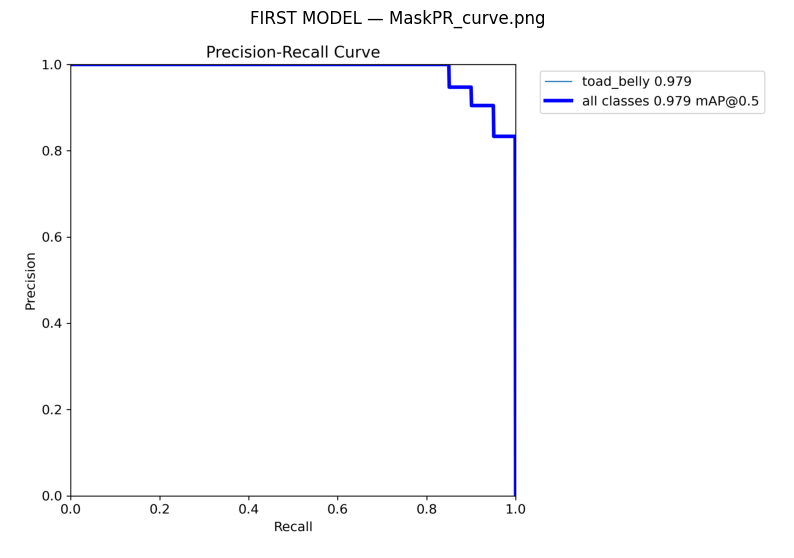

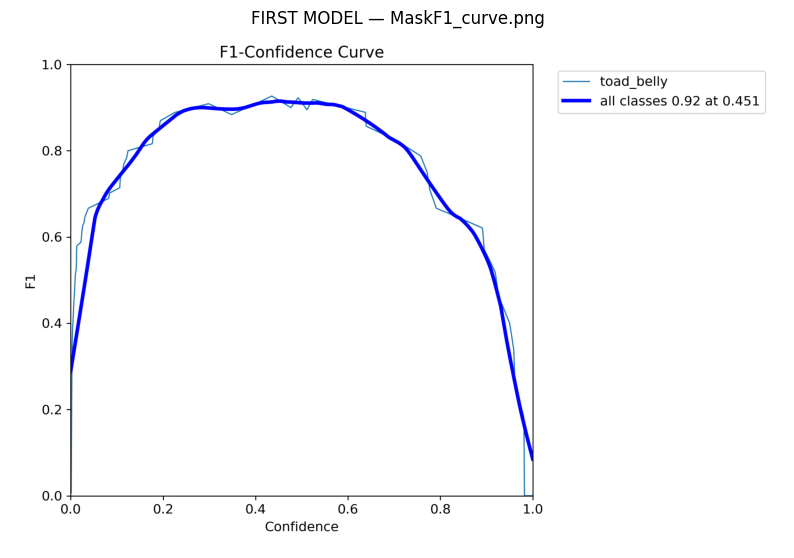

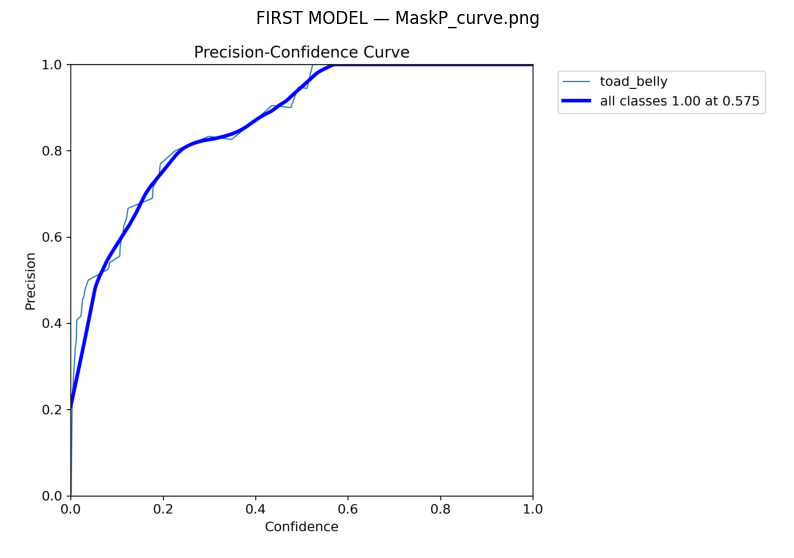

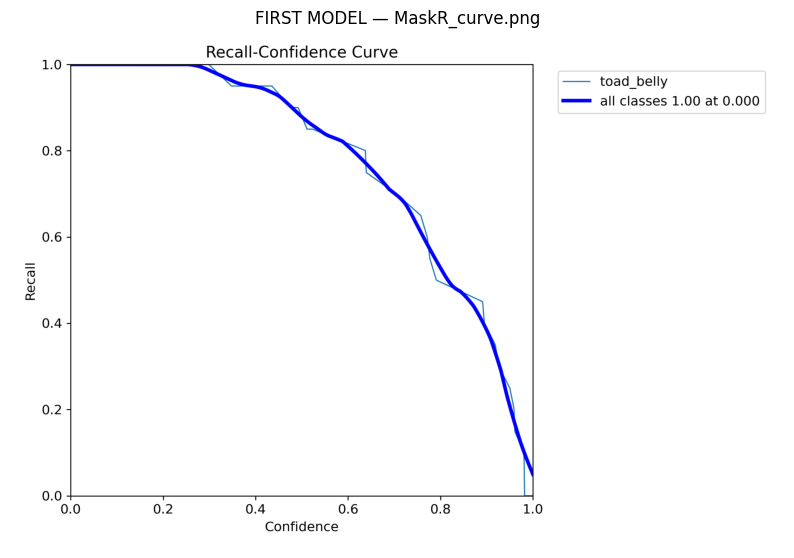

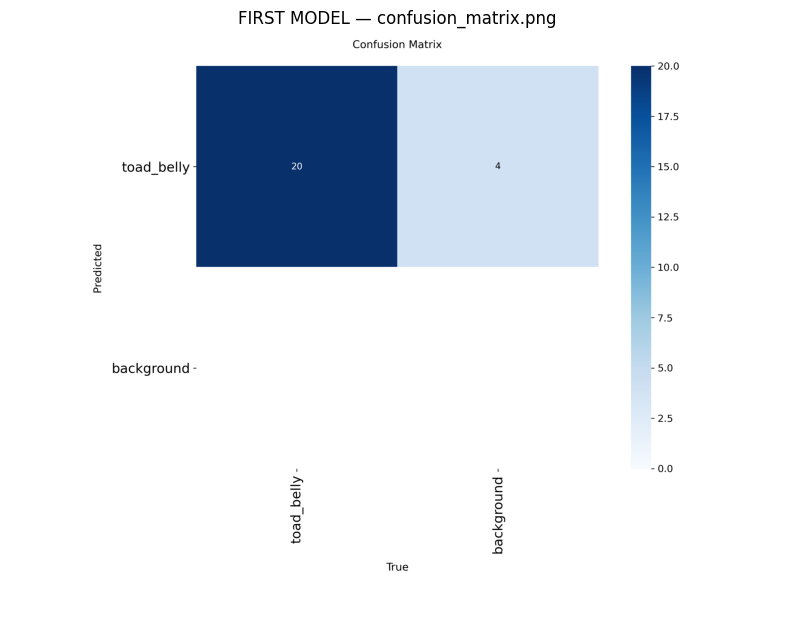

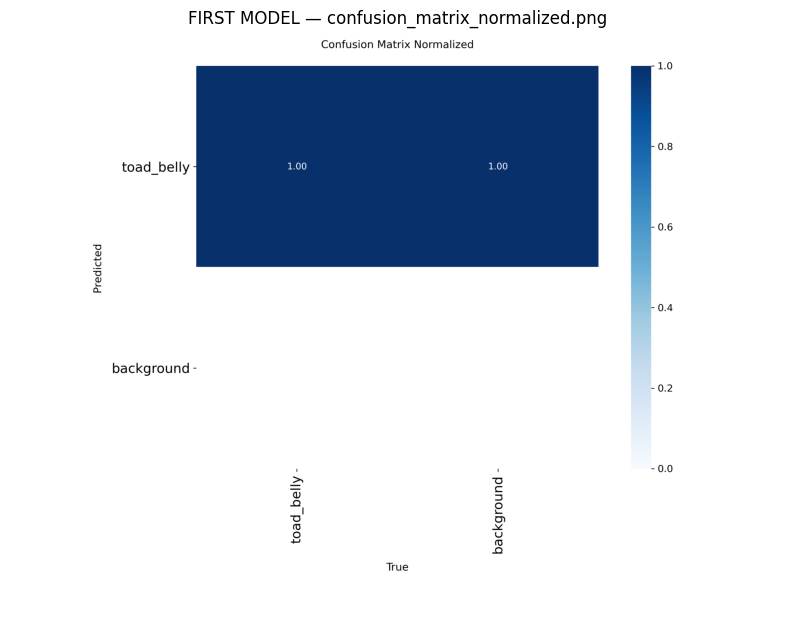

In [ ]:
display_validation_plots(
    first_metrics.save_dir,
    title="FIRST MODEL"
)

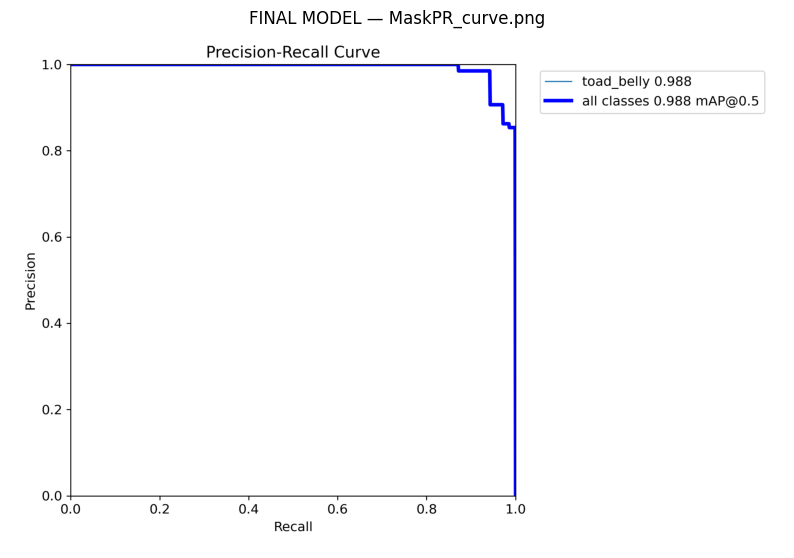

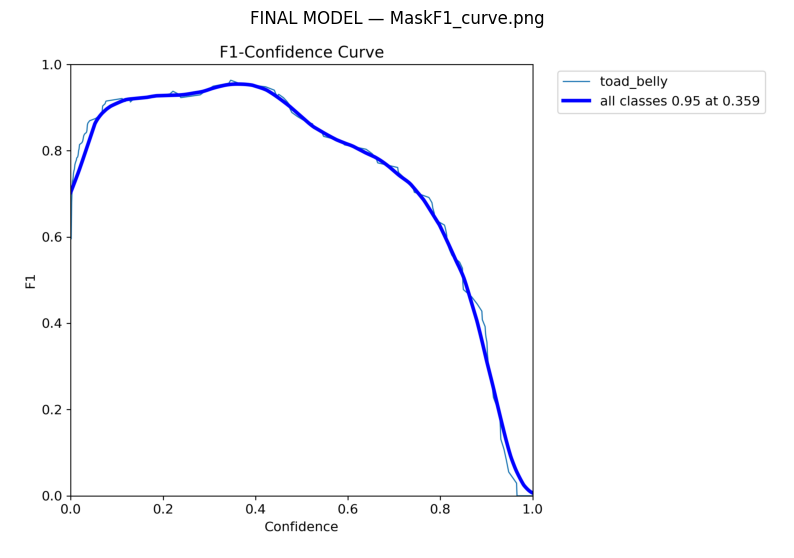

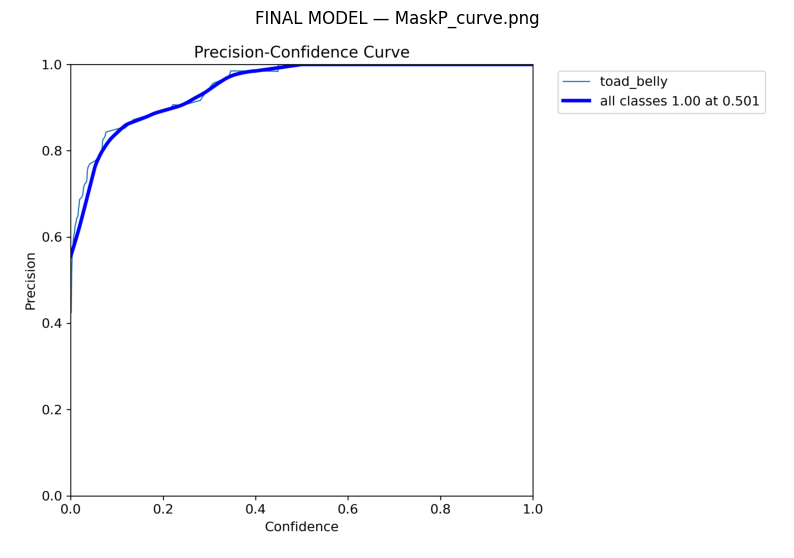

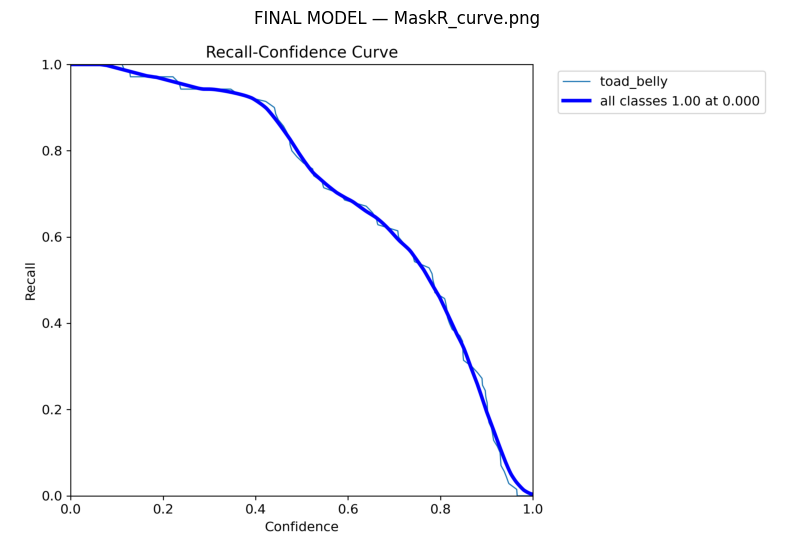

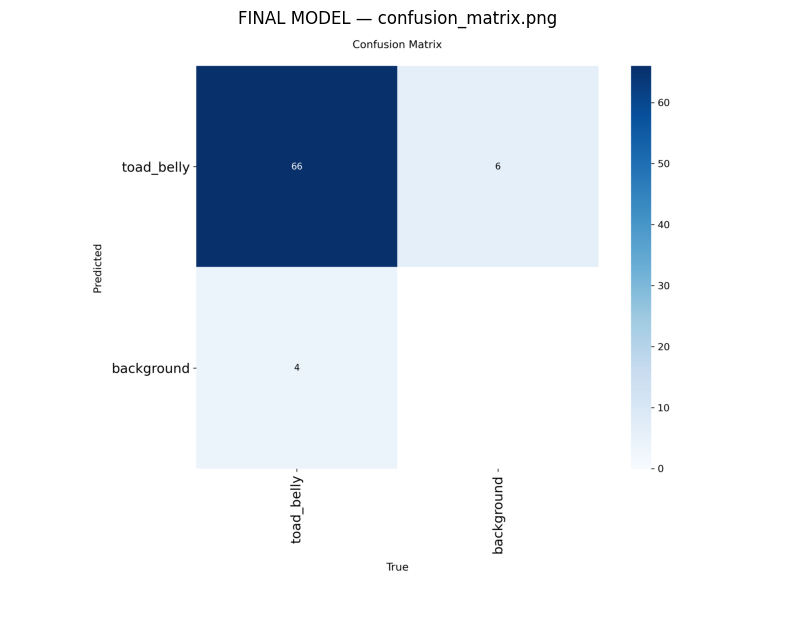

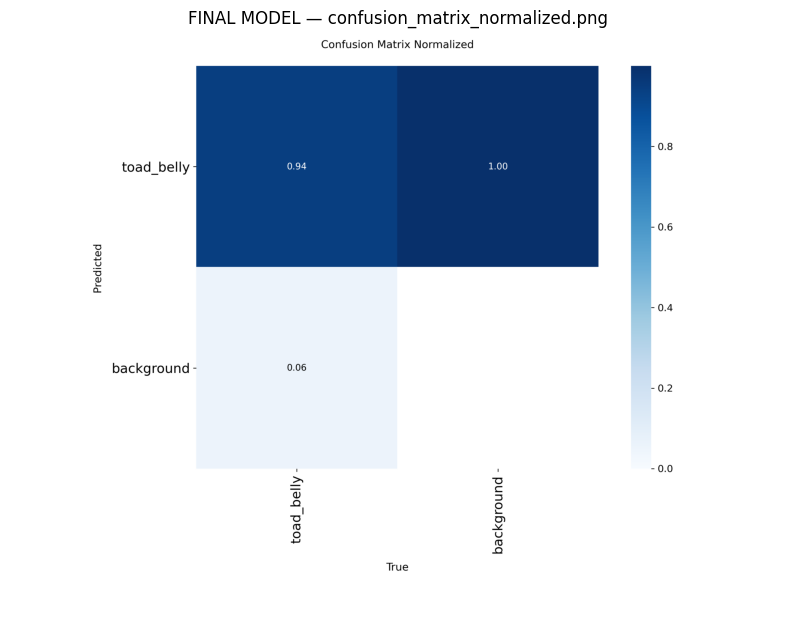

In [ ]:
display_validation_plots(
    final_metrics.save_dir,
    title="FINAL MODEL"
)

In [ ]:
def display_prediction_examples(save_dir, title="Model"):

    save_dir = Path(save_dir)

    prediction_images = sorted(
        save_dir.glob("val_batch*_pred.jpg")
    )

    label_images = sorted(
        save_dir.glob("val_batch*_labels.jpg")
    )

    print("Prediction batches:", len(prediction_images))
    print("Ground-truth batches:", len(label_images))

    for label_path, pred_path in zip(
        label_images,
        prediction_images
    ):

        label_img = Image.open(label_path)
        pred_img = Image.open(pred_path)

        plt.figure(figsize=(12, 10))
        plt.imshow(label_img)
        plt.title(
            f"{title} — Ground Truth"
        )
        plt.axis("off")
        plt.show()

        plt.figure(figsize=(12, 10))
        plt.imshow(pred_img)
        plt.title(
            f"{title} — Prediction"
        )
        plt.axis("off")
        plt.show()

Prediction batches: 2
Ground-truth batches: 2


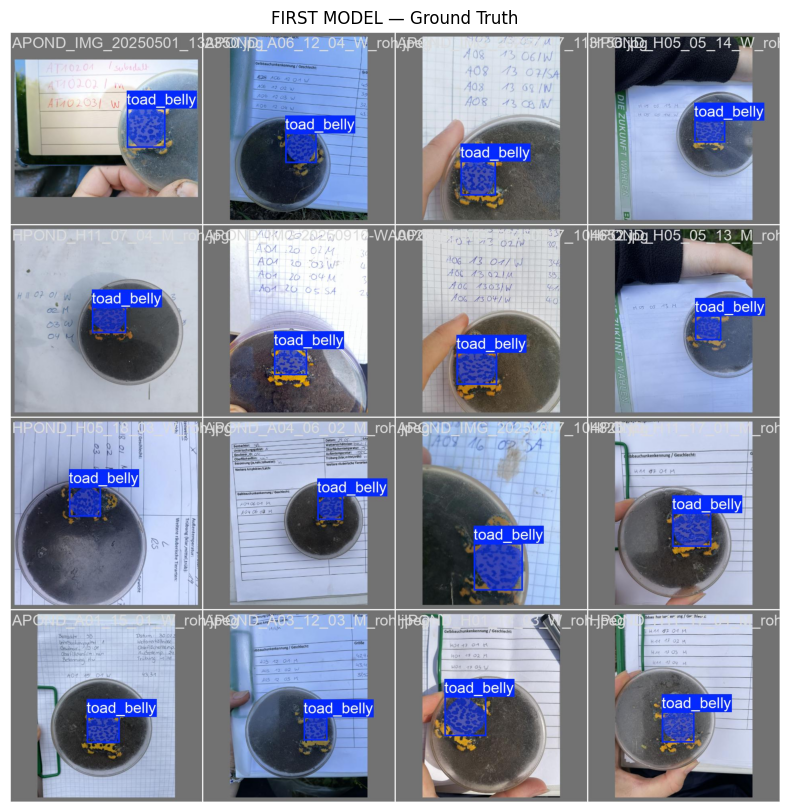

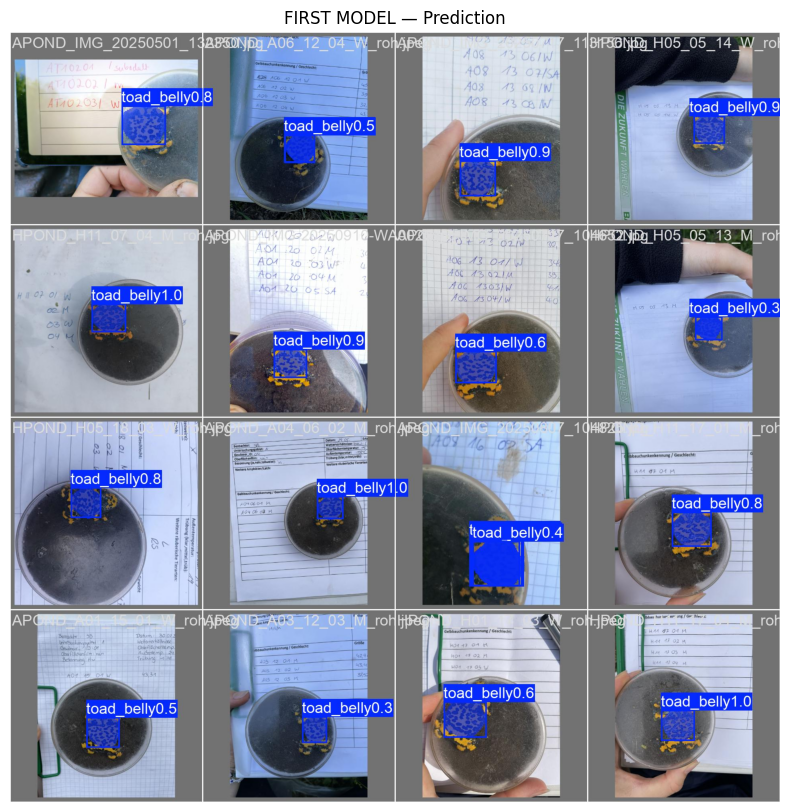

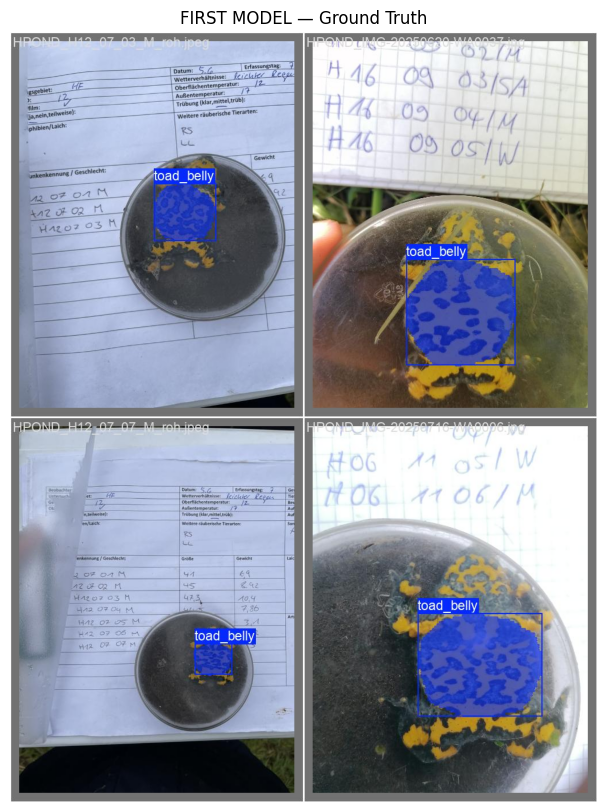

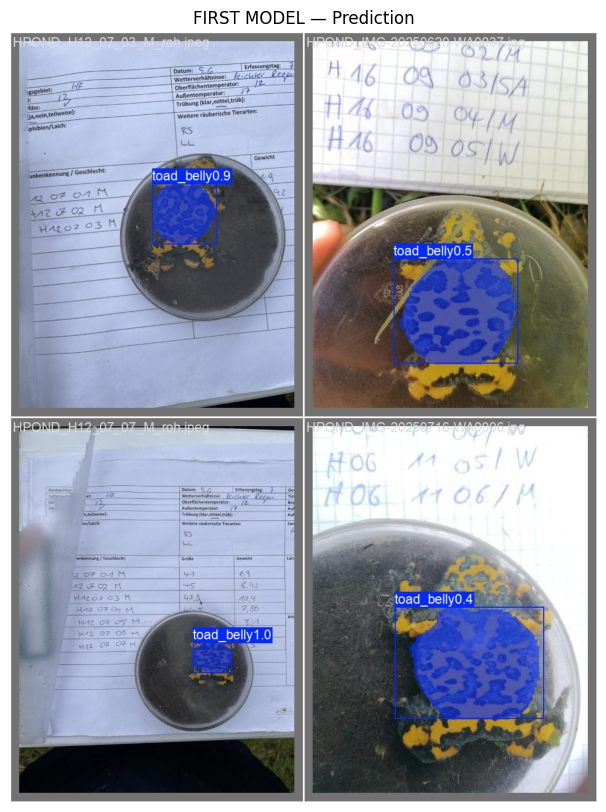

In [ ]:
display_prediction_examples(
    first_metrics.save_dir,
    "FIRST MODEL"
)

Prediction batches: 3
Ground-truth batches: 3


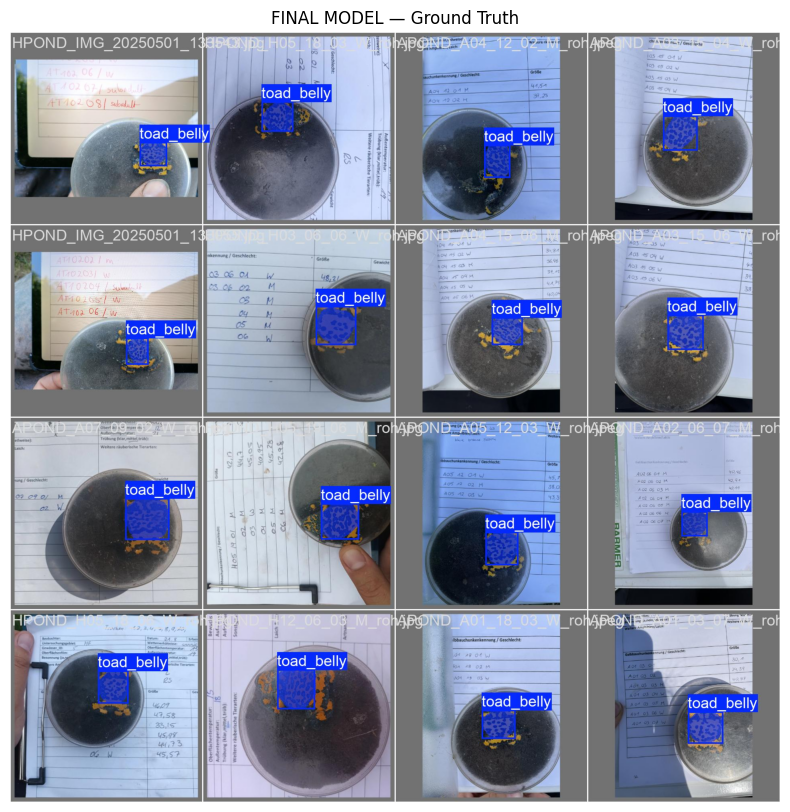

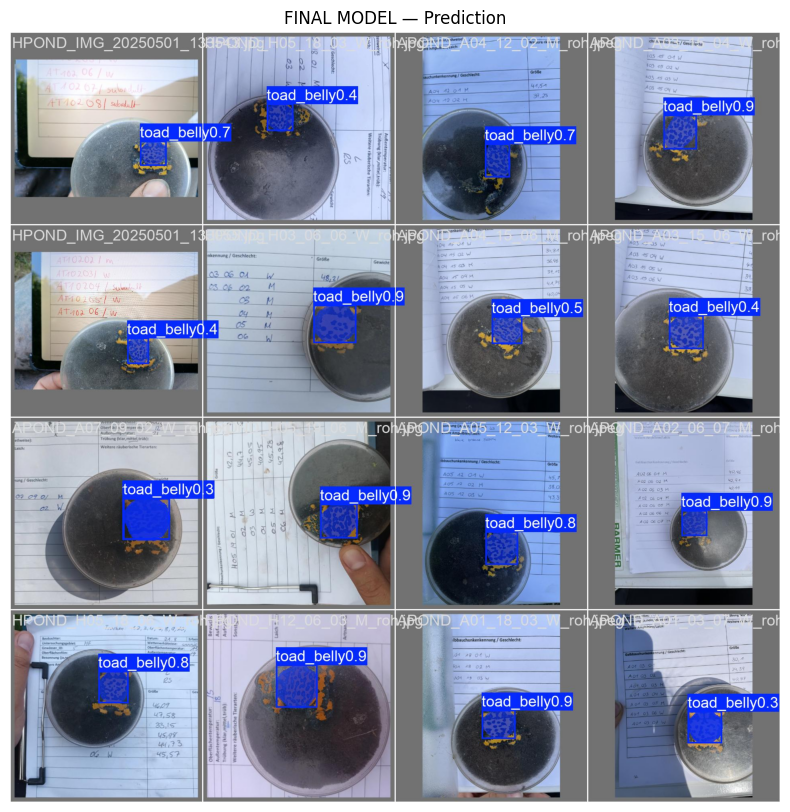

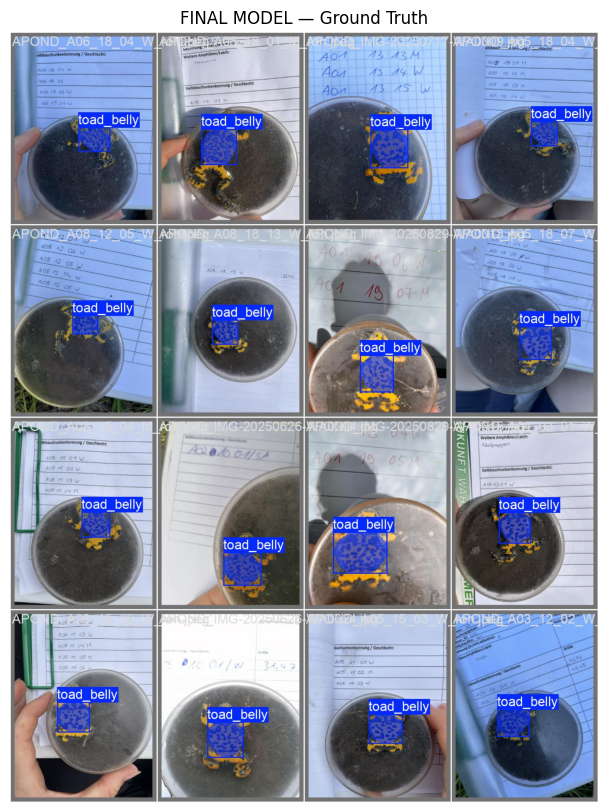

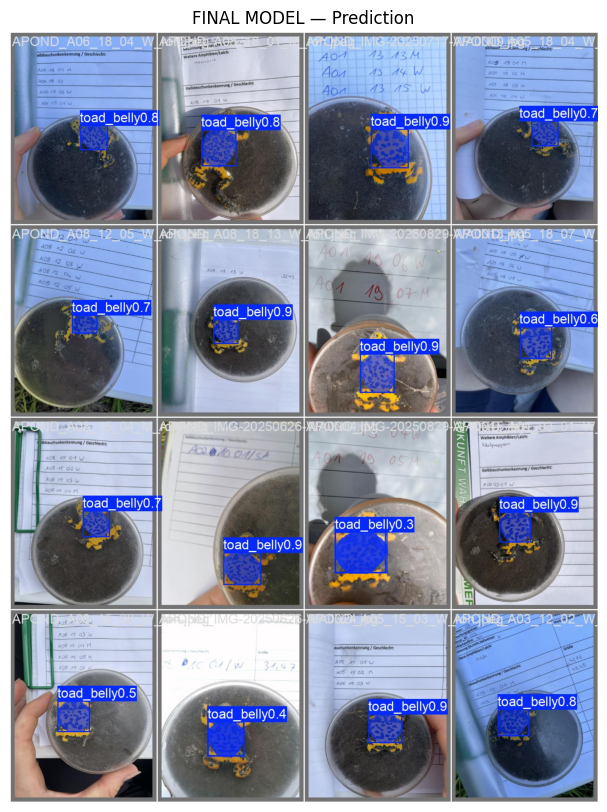

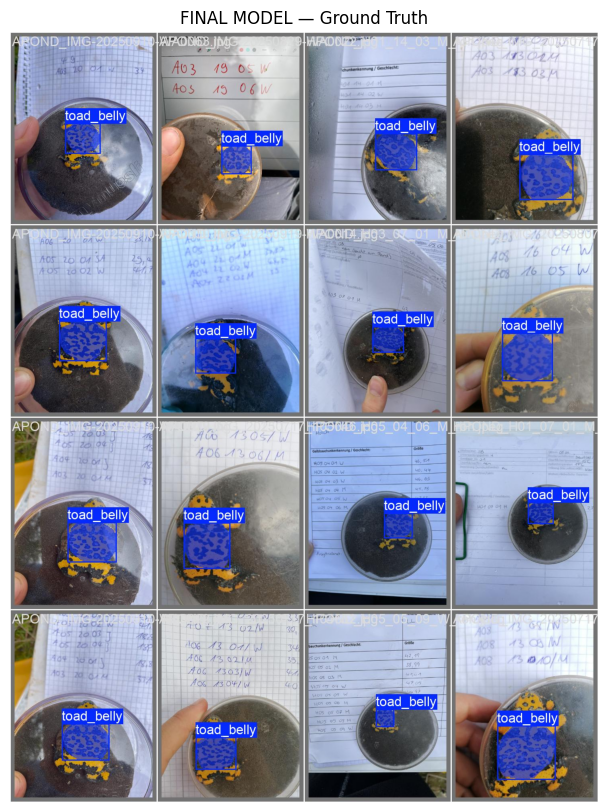

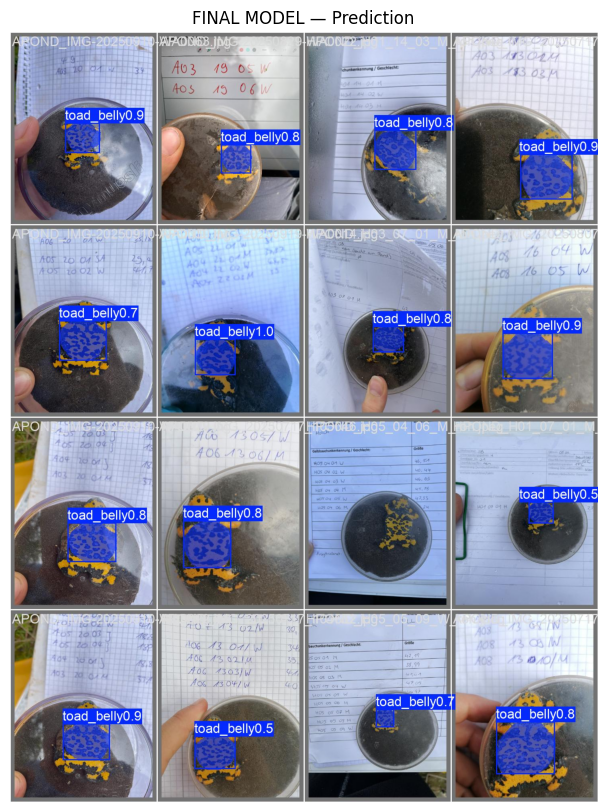

In [ ]:
display_prediction_examples(
    final_metrics.save_dir,
    "FINAL MODEL"
)

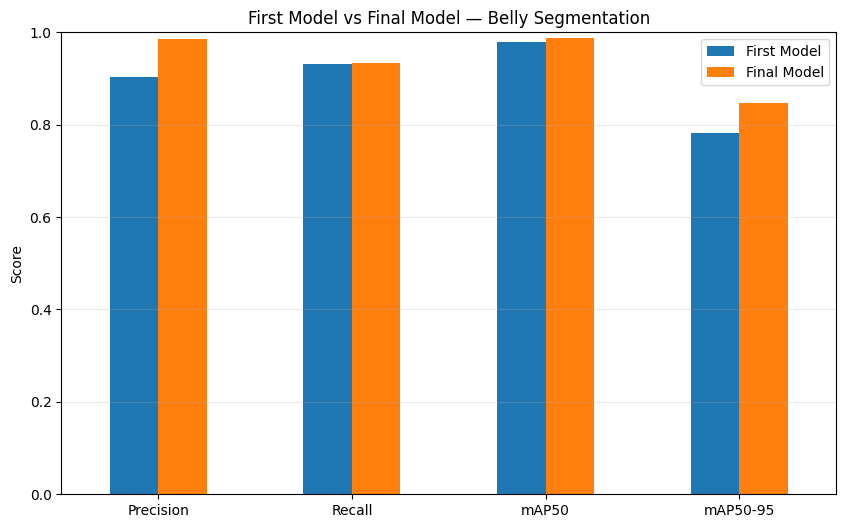

In [ ]:
mask_comparison = pd.DataFrame({
    "First Model": [
        first_metrics.seg.mp,
        first_metrics.seg.mr,
        first_metrics.seg.map50,
        first_metrics.seg.map
    ],

    "Final Model": [
        final_metrics.seg.mp,
        final_metrics.seg.mr,
        final_metrics.seg.map50,
        final_metrics.seg.map
    ]
},
index=[
    "Precision",
    "Recall",
    "mAP50",
    "mAP50-95"
])

ax = mask_comparison.plot(
    kind="bar",
    figsize=(10, 6)
)

plt.title(
    "First Model vs Final Model — Belly Segmentation"
)

plt.ylabel("Score")
plt.ylim(0, 1)
plt.xticks(rotation=0)
plt.grid(axis="y", alpha=0.25)
plt.legend()
plt.show()

In [ ]:
!pip uninstall -y transformers -q

!pip install -q \
    "transformers==4.45.2" \
    "huggingface_hub" \
    "safetensors" \
    "timm>=1.0.9" \
    "torchvision" \
    "scikit-learn" \
    "pillow"

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

from pathlib import Path

import numpy as np
import pandas as pd
import torch
import torch.nn.functional as F

from PIL import Image

import matplotlib.pyplot as plt

from torch.utils.data import Dataset, DataLoader
from torchvision import transforms

from transformers import AutoConfig, AutoModel
from huggingface_hub import hf_hub_download
from safetensors.torch import load_file

print("Torch version:", torch.__version__)

import transformers
print("Transformers version:", transformers.__version__)

DEVICE = "cuda" if torch.cuda.is_available() else "cpu"

print("Device:", DEVICE)

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


The cache for model files in Transformers v4.22.0 has been updated. Migrating your old cache. This is a one-time only operation. You can interrupt this and resume the migration later on by calling `transformers.utils.move_cache()`.


0it [00:00, ?it/s]

Torch version: 2.11.0+cu128
Transformers version: 4.45.2
Device: cuda


In [ ]:
RCS_ROOT = Path("/content/drive/MyDrive/RCS")

BELLY_FOLDER = RCS_ROOT / "A_POND_BELLIES_FINAL"

OUTPUT_FOLDER = RCS_ROOT / "miewid_results"

OUTPUT_FOLDER.mkdir(
    parents=True,
    exist_ok=True
)

image_paths = sorted(
    list(BELLY_FOLDER.glob("*.jpg")) +
    list(BELLY_FOLDER.glob("*.jpeg")) +
    list(BELLY_FOLDER.glob("*.JPG")) +
    list(BELLY_FOLDER.glob("*.JPEG"))
)

print("Belly folder:", BELLY_FOLDER)
print("Number of belly images:", len(image_paths))

for path in image_paths[:10]:
    print(path.name)

Belly folder: /content/drive/MyDrive/RCS/A_POND_BELLIES_FINAL
Number of belly images: 192
A01_03_07_W_roh_BELLY.jpg
A01_05_03_W_roh_BELLY.jpg
A01_06_01_SA_roh_BELLY.jpg
A01_08_01_W_roh_BELLY.jpg
A01_09_21_W_roh_BELLY.jpg
A01_12_01_M_roh_BELLY.jpg
A01_15_01_W_roh_BELLY.jpg
A01_15_03_W_roh_BELLY.jpg
A01_15_06_W_roh_BELLY.jpg
A01_15_07_W_roh_BELLY.jpg


In [ ]:
MODEL_NAME = "conservationxlabs/miewid-msv3"

config = AutoConfig.from_pretrained(
    MODEL_NAME,
    trust_remote_code=True
)

model = AutoModel.from_config(
    config,
    trust_remote_code=True
)

# Compatibility fix
if not hasattr(model, "all_tied_weights_keys"):
    model.all_tied_weights_keys = {}

print("Model architecture created")
print("Model type:", type(model))

/usr/local/lib/python3.13/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(
A new version of the following files was downloaded from https://huggingface.co/conservationxlabs/miewid-msv3:
- heads.py
. Make sure to double-check they do not contain any added malicious code. To avoid downloading new versions of the code file, you can pin a revision.


Building Model Backbone for efficientnetv2_rw_m model
config.model_name efficientnetv2_rw_m
model_name efficientnetv2_rw_m
final_in_features 2152
Model architecture created
Model type: <class 'transformers_modules.conservationxlabs.miewid-msv3.4f1d7f2b521149e5fe34bb85f377248ce9971a7d.modeling_miewid.MiewIdNet'>


In [ ]:
weights_path = hf_hub_download(
    repo_id=MODEL_NAME,
    filename="model.safetensors"
)

print("Weights file:")
print(weights_path)

Weights file:
/root/.cache/huggingface/hub/models--conservationxlabs--miewid-msv3/snapshots/4f1d7f2b521149e5fe34bb85f377248ce9971a7d/model.safetensors


In [ ]:
state_dict = load_file(
    weights_path
)

load_result = model.load_state_dict(
    state_dict,
    strict=False
)

print("Missing keys:", len(load_result.missing_keys))
print("Unexpected keys:", len(load_result.unexpected_keys))

print("First missing keys:")
print(load_result.missing_keys[:10])

print("First unexpected keys:")
print(load_result.unexpected_keys[:10])

Missing keys: 0
Unexpected keys: 0
First missing keys:
[]
First unexpected keys:
[]


In [ ]:
model = model.to(DEVICE)

model.eval()

print("MiewID ready")
print("Device:", DEVICE)

MiewID ready
Device: cuda


In [ ]:
miewid_transform = transforms.Compose([

    transforms.Resize(
        (440, 440)
    ),

    transforms.ToTensor(),

    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
])

print("Preprocessing ready")

Preprocessing ready


In [ ]:
class BellyDataset(Dataset):

    def __init__(
        self,
        image_paths,
        transform
    ):

        self.image_paths = image_paths
        self.transform = transform

    def __len__(self):

        return len(
            self.image_paths
        )

    def __getitem__(
        self,
        index
    ):

        image_path = (
            self.image_paths[index]
        )

        image = Image.open(
            image_path
        ).convert("RGB")

        image = self.transform(
            image
        )

        return (
            image,
            image_path.name
        )


belly_dataset = BellyDataset(
    image_paths=image_paths,
    transform=miewid_transform
)

print(
    "Dataset images:",
    len(belly_dataset)
)

Dataset images: 192


In [ ]:
belly_loader = DataLoader(
    belly_dataset,
    batch_size=8,
    shuffle=False,
    num_workers=2
)

print(
    "Number of batches:",
    len(belly_loader)
)

Number of batches: 24


In [ ]:
images, filenames = next(
    iter(belly_loader)
)

print(
    "Batch shape:",
    images.shape
)

print(
    "Number of filenames:",
    len(filenames)
)

print(
    "First filename:",
    filenames[0]
)

Batch shape: torch.Size([8, 3, 440, 440])
Number of filenames: 8
First filename: A01_03_07_W_roh_BELLY.jpg


In [ ]:
images = images.to(DEVICE)

with torch.no_grad():

    test_output = model(
        images
    )

print(
    "Output type:",
    type(test_output)
)

print(
    "Output shape:",
    test_output.shape
)

Output type: <class 'torch.Tensor'>
Output shape: torch.Size([8, 2152])


In [ ]:
all_embeddings = []
all_filenames = []

model.eval()

with torch.no_grad():

    for batch_number, (
        images,
        filenames
    ) in enumerate(
        belly_loader,
        start=1
    ):

        images = images.to(
            DEVICE
        )

        embeddings_batch = model(
            images
        )

        # L2 normalization
        embeddings_batch = F.normalize(
            embeddings_batch,
            p=2,
            dim=1
        )

        all_embeddings.append(
            embeddings_batch
            .cpu()
            .numpy()
        )

        all_filenames.extend(
            list(filenames)
        )

        print(
            f"Processed batch "
            f"{batch_number}/"
            f"{len(belly_loader)}"
        )


embeddings = np.vstack(
    all_embeddings
)

print()
print(
    "Number of images:",
    len(all_filenames)
)

print(
    "Embedding matrix:",
    embeddings.shape
)

Processed batch 1/24
Processed batch 2/24
Processed batch 3/24
Processed batch 4/24
Processed batch 5/24
Processed batch 6/24
Processed batch 7/24
Processed batch 8/24
Processed batch 9/24
Processed batch 10/24
Processed batch 11/24
Processed batch 12/24
Processed batch 13/24
Processed batch 14/24
Processed batch 15/24
Processed batch 16/24
Processed batch 17/24
Processed batch 18/24
Processed batch 19/24
Processed batch 20/24
Processed batch 21/24
Processed batch 22/24
Processed batch 23/24
Processed batch 24/24

Number of images: 192
Embedding matrix: (192, 2152)


In [ ]:
embedding_norms = np.linalg.norm(
    embeddings,
    axis=1
)

print(
    "First 10 norms:"
)

print(
    embedding_norms[:10]
)

print(
    "Mean norm:",
    embedding_norms.mean()
)

First 10 norms:
[1.         0.99999994 1.         1.         1.         1.
 1.         0.99999994 1.         0.99999994]
Mean norm: 1.0


In [ ]:
np.save(
    OUTPUT_FOLDER /
    "miewid_embeddings.npy",
    embeddings
)

filename_df = pd.DataFrame({
    "filename": all_filenames
})

filename_df.to_csv(
    OUTPUT_FOLDER /
    "miewid_filenames.csv",
    index=False
)

print("Embeddings saved")

Embeddings saved


In [ ]:
similarity_matrix = (
    embeddings
    @
    embeddings.T
)

print(
    "Similarity matrix shape:",
    similarity_matrix.shape
)

print(
    "Minimum similarity:",
    similarity_matrix.min()
)

print(
    "Maximum similarity:",
    similarity_matrix.max()
)

Similarity matrix shape: (192, 192)
Minimum similarity: 0.235709
Maximum similarity: 1.0000004


In [ ]:
np.fill_diagonal(
    similarity_matrix,
    -np.inf
)

print(
    "Self-matches removed"
)

Self-matches removed


In [ ]:
TOP_K = 20

ranking_rows = []

for query_index, query_name in enumerate(
    all_filenames
):

    scores = similarity_matrix[
        query_index
    ]

    ranked_indices = np.argsort(
        scores
    )[::-1][:TOP_K]

    for rank, candidate_index in enumerate(
        ranked_indices,
        start=1
    ):

        ranking_rows.append({

            "Query":
                query_name,

            "Rank":
                rank,

            "Candidate":
                all_filenames[
                    candidate_index
                ],

            "Similarity":
                float(
                    scores[
                        candidate_index
                    ]
                )
        })


ranking_df = pd.DataFrame(
    ranking_rows
)

ranking_df.head(20)

,Query,Rank,Candidate,Similarity
0,A01_03_07_W_roh_BELLY.jpg,1,A08_18_13_W_roh_BELLY.jpg,0.623735
1,A01_03_07_W_roh_BELLY.jpg,2,A04_03_01_W_roh_BELLY.jpg,0.622446
2,A01_03_07_W_roh_BELLY.jpg,3,A08_12_13_W_roh_BELLY.jpg,0.620795
3,A01_03_07_W_roh_BELLY.jpg,4,A06_15_02_W_roh_BELLY.jpg,0.617627
4,A01_03_07_W_roh_BELLY.jpg,5,IMG-20250607-WA0003_BELLY.jpg,0.613391
5,A01_03_07_W_roh_BELLY.jpg,6,A05_18_07_W_roh_BELLY.jpg,0.611871
6,A01_03_07_W_roh_BELLY.jpg,7,A08_15_14_W_roh_BELLY.jpg,0.608777
7,A01_03_07_W_roh_BELLY.jpg,8,A06_12_01_W_roh_BELLY.jpg,0.604180
8,A01_03_07_W_roh_BELLY.jpg,9,IMG-20250607-WA0006_BELLY.jpg,0.601863
9,A01_03_07_W_roh_BELLY.jpg,10,IMG_20250717_111516_BELLY.jpg,0.601202


In [ ]:
TOP20_FILE = (
    OUTPUT_FOLDER /
    "MiewID_Top20_candidates.csv"
)

ranking_df.to_csv(
    TOP20_FILE,
    index=False
)

print(
    "Saved:"
)

print(
    TOP20_FILE
)

Saved:
/content/drive/MyDrive/RCS/miewid_results/MiewID_Top20_candidates.csv


In [ ]:
query_name = all_filenames[0]

query_results = ranking_df[
    ranking_df["Query"]
    ==
    query_name
]

query_results

,Query,Rank,Candidate,Similarity
0,A01_03_07_W_roh_BELLY.jpg,1,A08_18_13_W_roh_BELLY.jpg,0.623735
1,A01_03_07_W_roh_BELLY.jpg,2,A04_03_01_W_roh_BELLY.jpg,0.622446
2,A01_03_07_W_roh_BELLY.jpg,3,A08_12_13_W_roh_BELLY.jpg,0.620795
3,A01_03_07_W_roh_BELLY.jpg,4,A06_15_02_W_roh_BELLY.jpg,0.617627
4,A01_03_07_W_roh_BELLY.jpg,5,IMG-20250607-WA0003_BELLY.jpg,0.613391
5,A01_03_07_W_roh_BELLY.jpg,6,A05_18_07_W_roh_BELLY.jpg,0.611871
6,A01_03_07_W_roh_BELLY.jpg,7,A08_15_14_W_roh_BELLY.jpg,0.608777
7,A01_03_07_W_roh_BELLY.jpg,8,A06_12_01_W_roh_BELLY.jpg,0.604180
8,A01_03_07_W_roh_BELLY.jpg,9,IMG-20250607-WA0006_BELLY.jpg,0.601863
9,A01_03_07_W_roh_BELLY.jpg,10,IMG_20250717_111516_BELLY.jpg,0.601202


In [ ]:
def show_top_matches(
    query_name,
    top_n=5
):

    matches = ranking_df[
        ranking_df["Query"]
        ==
        query_name
    ].head(
        top_n
    )

    fig, axes = plt.subplots(
        1,
        top_n + 1,
        figsize=(
            4 * (top_n + 1),
            5
        )
    )

    # Query
    query_path = (
        BELLY_FOLDER /
        query_name
    )

    query_image = Image.open(
        query_path
    ).convert(
        "RGB"
    )

    axes[0].imshow(
        query_image
    )

    axes[0].set_title(
        "QUERY"
    )

    axes[0].axis(
        "off"
    )

    # Candidates
    for plot_index, (
        _,
        row
    ) in enumerate(
        matches.iterrows(),
        start=1
    ):

        candidate_path = (
            BELLY_FOLDER /
            row["Candidate"]
        )

        candidate_image = (
            Image.open(
                candidate_path
            )
            .convert(
                "RGB"
            )
        )

        axes[
            plot_index
        ].imshow(
            candidate_image
        )

        axes[
            plot_index
        ].set_title(
            f"Rank "
            f"{int(row['Rank'])}\n"
            f"Similarity "
            f"{row['Similarity']:.3f}"
        )

        axes[
            plot_index
        ].axis(
            "off"
        )

    plt.tight_layout()

    plt.show()

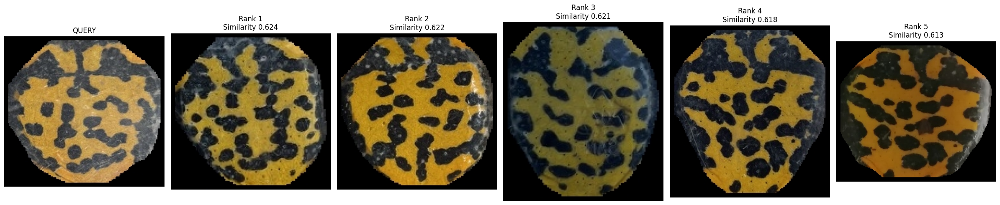

In [ ]:
show_top_matches(
    all_filenames[0],
    top_n=5
)

In [ ]:
pair_rows = []

for i in range(
    len(all_filenames)
):

    for j in range(
        i + 1,
        len(all_filenames)
    ):

        pair_rows.append({

            "Image_1":
                all_filenames[i],

            "Image_2":
                all_filenames[j],

            "Similarity":
                float(
                    similarity_matrix[
                        i,
                        j
                    ]
                )
        })


pairs_df = pd.DataFrame(
    pair_rows
)

pairs_df = pairs_df.sort_values(
    "Similarity",
    ascending=False
).reset_index(
    drop=True
)

print(
    "Unique pairs:",
    len(pairs_df)
)

pairs_df.head(20)

Unique pairs: 18336


,Image_1,Image_2,Similarity
0,IMG-20250626-WA0016_BELLY.jpg,IMG-20250626-WA0020_BELLY.jpg,0.970828
1,IMG-20250607-WA0003_BELLY.jpg,IMG-20250607-WA0006_BELLY.jpg,0.952405
2,IMG-20250910-WA0027_BELLY.jpg,IMG-20250910-WA0030_BELLY.jpg,0.951041
3,IMG-20250910-WA0022_BELLY.jpg,IMG-20250910-WA0029_BELLY.jpg,0.944347
4,IMG-20250910-WA0014_BELLY.jpg,IMG-20250910-WA0025_BELLY.jpg,0.934125
5,IMG-20250626-WA0002_BELLY.jpg,IMG-20250626-WA0004_BELLY.jpg,0.918070
6,A01_15_07_W_roh_BELLY.jpg,A01_18_03_W_roh_BELLY.jpg,0.915478
7,IMG-20250626-WA0009_BELLY.jpg,IMG-20250626-WA0011_BELLY.jpg,0.911575
8,IMG-20250919-WA0011_BELLY.jpg,IMG-20250919-WA0014_BELLY.jpg,0.898566
9,IMG-20250919-WA0019_BELLY.jpg,IMG-20250919-WA0020_BELLY.jpg,0.895545


In [ ]:
pairs_df.to_csv(
    OUTPUT_FOLDER /
    "MiewID_all_pair_similarities.csv",
    index=False
)

print(
    "Saved all pair similarities"
)

Saved all pair similarities


Mean similarity: 0.5019358966010338
Median similarity: 0.5056810975074768
Minimum: 0.23570899665355682
Maximum: 0.9708284139633179


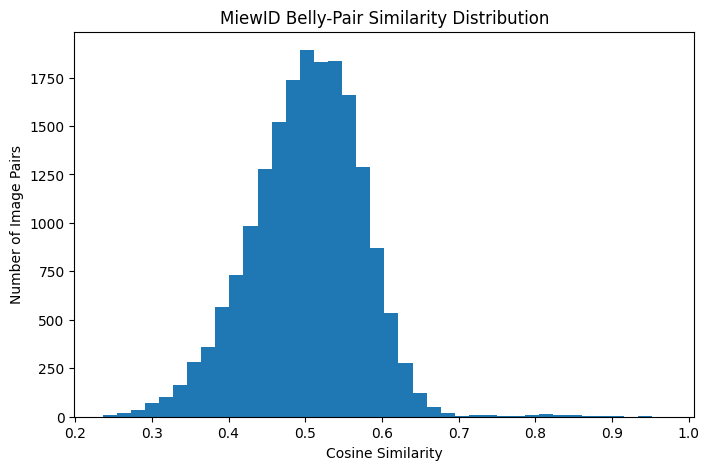

In [ ]:
pair_scores = (
    pairs_df[
        "Similarity"
    ].values
)

print(
    "Mean similarity:",
    pair_scores.mean()
)

print(
    "Median similarity:",
    np.median(
        pair_scores
    )
)

print(
    "Minimum:",
    pair_scores.min()
)

print(
    "Maximum:",
    pair_scores.max()
)

plt.figure(
    figsize=(8, 5)
)

plt.hist(
    pair_scores,
    bins=40
)

plt.xlabel(
    "Cosine Similarity"
)

plt.ylabel(
    "Number of Image Pairs"
)

plt.title(
    "MiewID Belly-Pair Similarity Distribution"
)

plt.show()

In [ ]:
pairs_df.head(20)

,Image_1,Image_2,Similarity
0,IMG-20250626-WA0016_BELLY.jpg,IMG-20250626-WA0020_BELLY.jpg,0.970828
1,IMG-20250607-WA0003_BELLY.jpg,IMG-20250607-WA0006_BELLY.jpg,0.952405
2,IMG-20250910-WA0027_BELLY.jpg,IMG-20250910-WA0030_BELLY.jpg,0.951041
3,IMG-20250910-WA0022_BELLY.jpg,IMG-20250910-WA0029_BELLY.jpg,0.944347
4,IMG-20250910-WA0014_BELLY.jpg,IMG-20250910-WA0025_BELLY.jpg,0.934125
5,IMG-20250626-WA0002_BELLY.jpg,IMG-20250626-WA0004_BELLY.jpg,0.918070
6,A01_15_07_W_roh_BELLY.jpg,A01_18_03_W_roh_BELLY.jpg,0.915478
7,IMG-20250626-WA0009_BELLY.jpg,IMG-20250626-WA0011_BELLY.jpg,0.911575
8,IMG-20250919-WA0011_BELLY.jpg,IMG-20250919-WA0014_BELLY.jpg,0.898566
9,IMG-20250919-WA0019_BELLY.jpg,IMG-20250919-WA0020_BELLY.jpg,0.895545


In [ ]:
from pathlib import Path
import pandas as pd
import numpy as np

RCS_ROOT = Path("/content/drive/MyDrive/RCS")

OUTPUT_FOLDER = RCS_ROOT / "miewid_results"

MIEWID_FILE = (
    OUTPUT_FOLDER /
    "MiewID_Top20_candidates.csv"
)

print("MiewID file exists:", MIEWID_FILE.exists())
print(MIEWID_FILE)

MiewID file exists: True
/content/drive/MyDrive/RCS/miewid_results/MiewID_Top20_candidates.csv


In [ ]:
from google.colab import drive

drive.mount(
    "/content/drive",
    force_remount=True
)

Mounted at /content/drive


In [ ]:
WILDID_FILE = (
    RCS_ROOT /
    "test" /
    "confirmed-matches.txt"
)

print("Wild-ID file exists:", WILDID_FILE.exists())
print(WILDID_FILE)

Wild-ID file exists: True
/content/drive/MyDrive/RCS/test/confirmed-matches.txt


In [ ]:
wildid_df = pd.read_csv(
    WILDID_FILE,
    sep=r"\s+",
    comment="#",
    header=None,
    names=[
        "Serial",
        "Query",
        "MatchSerial",
        "ConfirmedMatch",
        "WildID_Rank",
        "WildID_Score"
    ],
    engine="python"
)

print(
    "Rows:",
    len(wildid_df)
)

wildid_df.head()

Rows: 192


,Serial,Query,MatchSerial,ConfirmedMatch,WildID_Rank,WildID_Score
0,0,A01_03_07_W_roh_BELLY.jpg,-1,NONE,0,NaN
1,1,A01_05_03_W_roh_BELLY.jpg,-1,NONE,0,NaN
2,2,A01_06_01_SA_roh_BELLY.jpg,-1,NONE,0,NaN
3,3,A01_08_01_W_roh_BELLY.jpg,-1,NONE,0,NaN
4,4,A01_09_21_W_roh_BELLY.jpg,-1,NONE,0,NaN


In [ ]:
confirmed_df = wildid_df[
    wildid_df[
        "ConfirmedMatch"
    ].astype(str).str.upper()
    !=
    "NONE"
].copy()

confirmed_df = confirmed_df[
    confirmed_df[
        "MatchSerial"
    ] != -1
].copy()

print(
    "Confirmed Wild-ID matches:",
    len(confirmed_df)
)

confirmed_df.head()

Confirmed Wild-ID matches: 62


,Serial,Query,MatchSerial,ConfirmedMatch,WildID_Rank,WildID_Score
10,10,A01_17_01_W_roh_BELLY.jpg,5,A01_12_01_M_roh_BELLY.jpg,1,0.212594
11,11,A01_18_01_W_roh_BELLY.jpg,6,A01_15_01_W_roh_BELLY.jpg,1,0.004389
13,13,A01_18_03_W_roh_BELLY.jpg,9,A01_15_07_W_roh_BELLY.jpg,1,0.421057
19,19,A02_03_01_W_roh_BELLY.jpg,6,A01_15_01_W_roh_BELLY.jpg,1,0.420170
21,21,A02_06_03_M_roh_BELLY.jpg,17,A01_18_12_M_roh_BELLY.jpg,1,0.042426


In [ ]:
print(
    confirmed_df[
        "WildID_Rank"
    ].value_counts()
    .sort_index()
)

WildID_Rank
1     57
2      2
8      1
17     1
19     1
Name: count, dtype: int64


In [ ]:
miewid_df = pd.read_csv(
    MIEWID_FILE
)

print(
    "MiewID ranking rows:",
    len(miewid_df)
)

print(
    "Unique queries:",
    miewid_df[
        "Query"
    ].nunique()
)

miewid_df.head()

MiewID ranking rows: 3840
Unique queries: 192


,Query,Rank,Candidate,Similarity
0,A01_03_07_W_roh_BELLY.jpg,1,A08_18_13_W_roh_BELLY.jpg,0.623735
1,A01_03_07_W_roh_BELLY.jpg,2,A04_03_01_W_roh_BELLY.jpg,0.622446
2,A01_03_07_W_roh_BELLY.jpg,3,A08_12_13_W_roh_BELLY.jpg,0.620795
3,A01_03_07_W_roh_BELLY.jpg,4,A06_15_02_W_roh_BELLY.jpg,0.617627
4,A01_03_07_W_roh_BELLY.jpg,5,IMG-20250607-WA0003_BELLY.jpg,0.613391


In [ ]:
def clean_filename(name):

    name = str(name)

    name = name.replace(
        "\\",
        "/"
    )

    name = name.split(
        "/"
    )[-1]

    return name.strip()


confirmed_df[
    "Query_clean"
] = confirmed_df[
    "Query"
].apply(
    clean_filename
)

confirmed_df[
    "Match_clean"
] = confirmed_df[
    "ConfirmedMatch"
].apply(
    clean_filename
)


miewid_df[
    "Query_clean"
] = miewid_df[
    "Query"
].apply(
    clean_filename
)

miewid_df[
    "Candidate_clean"
] = miewid_df[
    "Candidate"
].apply(
    clean_filename
)

print(
    confirmed_df[
        [
            "Query_clean",
            "Match_clean"
        ]
    ].head()
)

                  Query_clean                Match_clean
10  A01_17_01_W_roh_BELLY.jpg  A01_12_01_M_roh_BELLY.jpg
11  A01_18_01_W_roh_BELLY.jpg  A01_15_01_W_roh_BELLY.jpg
13  A01_18_03_W_roh_BELLY.jpg  A01_15_07_W_roh_BELLY.jpg
19  A02_03_01_W_roh_BELLY.jpg  A01_15_01_W_roh_BELLY.jpg
21  A02_06_03_M_roh_BELLY.jpg  A01_18_12_M_roh_BELLY.jpg


In [ ]:
evaluation_rows = []

for _, row in confirmed_df.iterrows():

    query = row[
        "Query_clean"
    ]

    true_match = row[
        "Match_clean"
    ]

    results = miewid_df[
        miewid_df[
            "Query_clean"
        ] == query
    ]

    match_result = results[
        results[
            "Candidate_clean"
        ] == true_match
    ]

    if len(match_result) > 0:

        miewid_rank = int(
            match_result.iloc[0][
                "Rank"
            ]
        )

        similarity = float(
            match_result.iloc[0][
                "Similarity"
            ]
        )

    else:

        miewid_rank = np.nan
        similarity = np.nan


    evaluation_rows.append({

        "Query":
            query,

        "Confirmed_Match":
            true_match,

        "WildID_Rank":
            int(
                row[
                    "WildID_Rank"
                ]
            ),

        "WildID_Score":
            row[
                "WildID_Score"
            ],

        "MiewID_Rank":
            miewid_rank,

        "MiewID_Similarity":
            similarity
    })


comparison_df = pd.DataFrame(
    evaluation_rows
)

comparison_df.head(20)

,Query,Confirmed_Match,WildID_Rank,WildID_Score,MiewID_Rank,MiewID_Similarity
0,A01_17_01_W_roh_BELLY.jpg,A01_12_01_M_roh_BELLY.jpg,1,0.212594,1.0,0.878886
1,A01_18_01_W_roh_BELLY.jpg,A01_15_01_W_roh_BELLY.jpg,1,0.004389,1.0,0.646585
2,A01_18_03_W_roh_BELLY.jpg,A01_15_07_W_roh_BELLY.jpg,1,0.421057,1.0,0.915478
3,A02_03_01_W_roh_BELLY.jpg,A01_15_01_W_roh_BELLY.jpg,1,0.420170,1.0,0.810244
4,A02_06_03_M_roh_BELLY.jpg,A01_18_12_M_roh_BELLY.jpg,1,0.042426,1.0,0.796774
5,A02_08_05_M_roh_BELLY.jpg,A02_06_04_M_roh_BELLY.jpg,19,0.000002,1.0,0.806881
6,A04_06_02_M_roh_BELLY.jpg,A01_18_04_M_roh_BELLY.jpg,1,0.067546,1.0,0.853207
7,A05_12_03_W_roh_BELLY.jpg,A04_15_05_W_roh_BELLY.jpg,1,0.432903,1.0,0.851670
8,A05_18_06_W_roh_BELLY.jpg,A04_15_05_W_roh_BELLY.jpg,1,0.480774,1.0,0.847646
9,A05_18_07_W_roh_BELLY.jpg,A04_03_01_W_roh_BELLY.jpg,1,0.119907,1.0,0.854231


In [ ]:
found_count = (
    comparison_df[
        "MiewID_Rank"
    ]
    .notna()
    .sum()
)

not_found_count = (
    comparison_df[
        "MiewID_Rank"
    ]
    .isna()
    .sum()
)

print(
    "Reference matches:",
    len(comparison_df)
)

print(
    "Found by MiewID Top-20:",
    found_count
)

print(
    "Not in MiewID Top-20:",
    not_found_count
)

Reference matches: 62
Found by MiewID Top-20: 58
Not in MiewID Top-20: 4


In [ ]:
def calculate_ranking_metrics(
    ranks,
    total_queries
):

    ranks = pd.Series(
        ranks
    ).dropna()

    metrics = {}

    for k in [
        1,
        3,
        5,
        10,
        20
    ]:

        correct = (
            ranks <= k
        ).sum()

        accuracy = (
            correct /
            total_queries
            *
            100
        )

        metrics[
            f"Top-{k}"
        ] = accuracy


    if len(ranks) > 0:

        metrics[
            "Mean Rank"
        ] = ranks.mean()

    else:

        metrics[
            "Mean Rank"
        ] = np.nan


    reciprocal_ranks = []

    for rank in pd.Series(
        ranks
    ):

        reciprocal_ranks.append(
            1 / rank
        )

    # Queries outside Top-20 count as zero
    missing = (
        total_queries
        -
        len(ranks)
    )

    reciprocal_ranks.extend(
        [0] * missing
    )

    metrics[
        "MRR"
    ] = np.mean(
        reciprocal_ranks
    )

    return metrics

In [ ]:
wildid_metrics = (
    calculate_ranking_metrics(
        comparison_df[
            "WildID_Rank"
        ],
        len(
            comparison_df
        )
    )
)

wildid_metrics

{'Top-1': np.float64(91.93548387096774),
 'Top-3': np.float64(95.16129032258065),
 'Top-5': np.float64(95.16129032258065),
 'Top-10': np.float64(96.7741935483871),
 'Top-20': np.float64(100.0),
 'Mean Rank': np.float64(1.6935483870967742),
 'MRR': np.float64(0.9392976630380505)}

In [ ]:
miewid_metrics = (
    calculate_ranking_metrics(
        comparison_df[
            "MiewID_Rank"
        ],
        len(
            comparison_df
        )
    )
)

miewid_metrics

{'Top-1': np.float64(66.12903225806451),
 'Top-3': np.float64(80.64516129032258),
 'Top-5': np.float64(83.87096774193549),
 'Top-10': np.float64(88.70967741935483),
 'Top-20': np.float64(93.54838709677419),
 'Mean Rank': np.float64(2.603448275862069),
 'MRR': np.float64(0.7439932155657962)}

In [ ]:
comparison_table = pd.DataFrame({

    "Method": [
        "Wild-ID",
        "MiewID-msv3"
    ],

    "Rank-1 (%)": [
        wildid_metrics[
            "Top-1"
        ],

        miewid_metrics[
            "Top-1"
        ]
    ],

    "Top-3 (%)": [
        wildid_metrics[
            "Top-3"
        ],

        miewid_metrics[
            "Top-3"
        ]
    ],

    "Top-5 (%)": [
        wildid_metrics[
            "Top-5"
        ],

        miewid_metrics[
            "Top-5"
        ]
    ],

    "Top-10 (%)": [
        wildid_metrics[
            "Top-10"
        ],

        miewid_metrics[
            "Top-10"
        ]
    ],

    "Top-20 (%)": [
        wildid_metrics[
            "Top-20"
        ],

        miewid_metrics[
            "Top-20"
        ]
    ],

    "Mean Rank": [
        wildid_metrics[
            "Mean Rank"
        ],

        miewid_metrics[
            "Mean Rank"
        ]
    ],

    "MRR": [
        wildid_metrics[
            "MRR"
        ],

        miewid_metrics[
            "MRR"
        ]
    ]
})


numeric_columns = (
    comparison_table
    .columns[
        1:
    ]
)

comparison_table[
    numeric_columns
] = comparison_table[
    numeric_columns
].round(
    3
)

comparison_table

,Method,Rank-1 (%),Top-3 (%),Top-5 (%),Top-10 (%),Top-20 (%),Mean Rank,MRR
0,Wild-ID,91.935,95.161,95.161,96.774,100.000,1.694,0.939
1,MiewID-msv3,66.129,80.645,83.871,88.710,93.548,2.603,0.744


In [ ]:
comparison_table.to_csv(
    OUTPUT_FOLDER /
    "WildID_vs_MiewID_comparison.csv",
    index=False
)

comparison_df.to_csv(
    OUTPUT_FOLDER /
    "WildID_vs_MiewID_pair_details.csv",
    index=False
)

print(
    "Comparison files saved."
)

Comparison files saved.


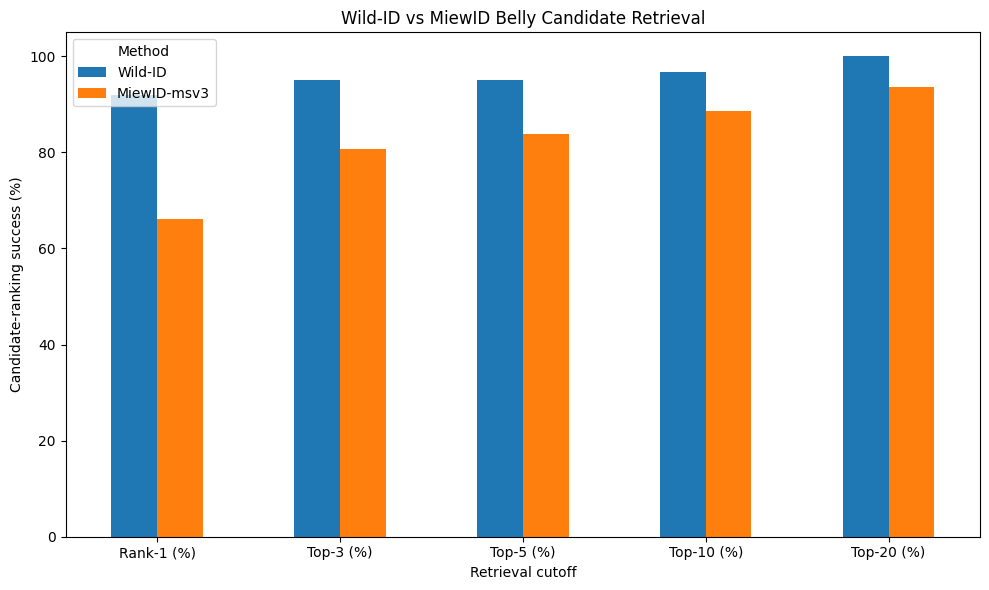

In [ ]:
import matplotlib.pyplot as plt

metrics_for_plot = [
    "Rank-1 (%)",
    "Top-3 (%)",
    "Top-5 (%)",
    "Top-10 (%)",
    "Top-20 (%)"
]

plot_df = (
    comparison_table
    .set_index(
        "Method"
    )[
        metrics_for_plot
    ]
    .T
)

ax = plot_df.plot(
    kind="bar",
    figsize=(10, 6)
)

plt.ylabel(
    "Candidate-ranking success (%)"
)

plt.xlabel(
    "Retrieval cutoff"
)

plt.title(
    "Wild-ID vs MiewID Belly Candidate Retrieval"
)

plt.ylim(
    0,
    105
)

plt.xticks(
    rotation=0
)

plt.legend(
    title="Method"
)

plt.tight_layout()

plt.savefig(
    OUTPUT_FOLDER /
    "WildID_vs_MiewID_comparison.png",
    dpi=300,
    bbox_inches="tight"
)

plt.show()

In [ ]:
better_miewid = comparison_df[
    comparison_df[
        "MiewID_Rank"
    ].notna()
    &
    (
        comparison_df[
            "MiewID_Rank"
        ]
        <
        comparison_df[
            "WildID_Rank"
        ]
    )
]

print(
    "MiewID ranked better:",
    len(better_miewid)
)

better_miewid.sort_values(
    "MiewID_Rank"
).head(
    20
)

MiewID ranked better: 4


,Query,Confirmed_Match,WildID_Rank,WildID_Score,MiewID_Rank,MiewID_Similarity
5,A02_08_05_M_roh_BELLY.jpg,A02_06_04_M_roh_BELLY.jpg,19,0.000002,1.0,0.806881
17,A08_15_03_W_roh_BELLY.jpg,A07_09_03_W_roh_BELLY.jpg,2,0.006503,1.0,0.691576
24,A08_18_17_W_roh_BELLY.jpg,A08_15_14_W_roh_BELLY.jpg,2,0.031823,1.0,0.662242
14,A07_08_04_M_roh_BELLY.jpg,A06_03_01_M_roh_BELLY.jpg,17,0.000004,2.0,0.622692


In [ ]:
better_wildid = comparison_df[
    comparison_df[
        "MiewID_Rank"
    ].isna()
    |
    (
        comparison_df[
            "WildID_Rank"
        ]
        <
        comparison_df[
            "MiewID_Rank"
        ]
    )
]

print(
    "Wild-ID ranked better:",
    len(better_wildid)
)

better_wildid.head(
    20
)

Wild-ID ranked better: 20


,Query,Confirmed_Match,WildID_Rank,WildID_Score,MiewID_Rank,MiewID_Similarity
11,A06_15_03_W_roh_BELLY.jpg,A06_14_02_W_roh_BELLY.jpg,1,0.206616,7.0,0.599635
21,A08_18_09_M_roh_BELLY.jpg,A08_15_05_M_roh_BELLY.jpg,1,0.107413,10.0,0.591148
22,A08_18_10_W_roh_BELLY.jpg,A08_12_15_W_roh_BELLY.jpg,1,0.160717,2.0,0.702618
23,A08_18_12_W_roh_BELLY.jpg,A08_15_21_M_roh_BELLY.jpg,1,0.242860,5.0,0.623251
25,A08_18_22_W_roh_BELLY.jpg,A08_15_04_M_roh_BELLY.jpg,1,0.560702,2.0,0.674225
26,IMG-20250607-WA0003_BELLY.jpg,A06_17_02_W__roh_BELLY.jpg,1,0.088032,4.0,0.765219
28,IMG-20250607-WA0007_BELLY.jpg,A08_17_17_W_roh_BELLY.jpg,1,0.115210,20.0,0.615018
30,IMG-20250626-WA0006_BELLY.jpg,IMG-20250626-WA0003_BELLY.jpg,1,0.465120,10.0,0.455989
32,IMG-20250626-WA0014_BELLY.jpg,A06_08_04_W_roh_BELLY.jpg,1,0.010501,NaN,NaN
36,IMG-20250717-WA0013_BELLY.jpg,A01_08_01_W_roh_BELLY.jpg,1,0.237531,NaN,NaN


In [ ]:
same_rank = comparison_df[
    comparison_df[
        "MiewID_Rank"
    ]
    ==
    comparison_df[
        "WildID_Rank"
    ]
]

print(
    "Same rank:",
    len(same_rank)
)

Same rank: 38


In [ ]:
# CELL 114
# Improved MiewID experiment - separate from old results

from pathlib import Path
import numpy as np
import pandas as pd
import torch
import torch.nn.functional as F

from PIL import Image, ImageEnhance, ImageOps
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms

MIEWID_V2_ROOT = (
    RCS_ROOT /
    "miewid_improved_results"
)

MIEWID_V2_ROOT.mkdir(
    parents=True,
    exist_ok=True
)

print("Improved MiewID folder:")
print(MIEWID_V2_ROOT)

print("\nOld results remain in:")
print(OUTPUT_FOLDER)

Improved MiewID folder:
/content/drive/MyDrive/RCS/miewid_improved_results

Old results remain in:
/content/drive/MyDrive/RCS/miewid_results


In [ ]:
transforms.Resize((440, 440))

Resize(size=(440, 440), interpolation=bilinear, max_size=None, antialias=True)

In [ ]:
# CELL 115

def resize_with_padding_v2(
    image,
    final_size=440,
    content_size=420
):

    image = image.convert("RGB")

    width, height = image.size

    scale = (
        content_size /
        max(width, height)
    )

    new_width = max(
        1,
        int(round(width * scale))
    )

    new_height = max(
        1,
        int(round(height * scale))
    )

    image = image.resize(
        (new_width, new_height),
        Image.Resampling.BILINEAR
    )

    pad_left = (
        final_size - new_width
    ) // 2

    pad_right = (
        final_size - new_width
        - pad_left
    )

    pad_top = (
        final_size - new_height
    ) // 2

    pad_bottom = (
        final_size - new_height
        - pad_top
    )

    image = ImageOps.expand(
        image,
        border=(
            pad_left,
            pad_top,
            pad_right,
            pad_bottom
        ),
        fill=(0, 0, 0)
    )

    return image


print("Aspect-ratio preprocessing ready")

Aspect-ratio preprocessing ready


In [ ]:
# CELL 114A — Rebuild belly image list safely

from pathlib import Path

RCS_ROOT = Path("/content/drive/MyDrive/RCS")

# Your final 192 YOLO belly crops
BELLY_FOLDER_V2 = RCS_ROOT / "A_POND_BELLIES_FINAL"

print("Belly folder:", BELLY_FOLDER_V2)
print("Folder exists:", BELLY_FOLDER_V2.exists())

VALID_EXTENSIONS = {".jpg", ".jpeg"}

image_paths = sorted([
    p for p in BELLY_FOLDER_V2.iterdir()
    if p.is_file()
    and p.suffix.lower() in VALID_EXTENSIONS
])

print("Number of belly images:", len(image_paths))

print("\nFirst 5:")
for p in image_paths[:5]:
    print(p.name)

Belly folder: /content/drive/MyDrive/RCS/A_POND_BELLIES_FINAL
Folder exists: True
Number of belly images: 192

First 5:
A01_03_07_W_roh_BELLY.jpg
A01_05_03_W_roh_BELLY.jpg
A01_06_01_SA_roh_BELLY.jpg
A01_08_01_W_roh_BELLY.jpg
A01_09_21_W_roh_BELLY.jpg


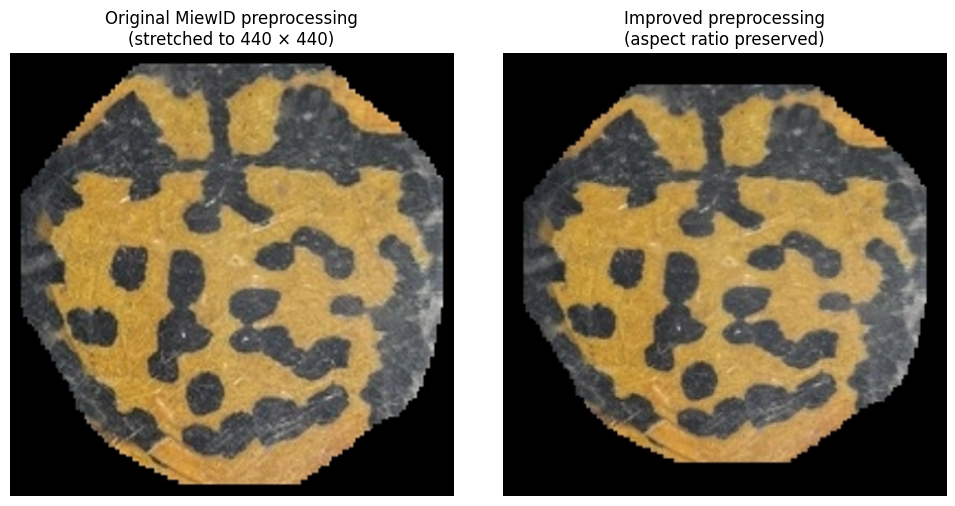

In [ ]:
# CELL 116

import matplotlib.pyplot as plt

example_path = image_paths[0]

example_image = Image.open(
    example_path
).convert("RGB")

old_style = example_image.resize(
    (440, 440)
)

new_style = resize_with_padding_v2(
    example_image
)

plt.figure(
    figsize=(10, 5)
)

plt.subplot(
    1,
    2,
    1
)

plt.imshow(old_style)
plt.title(
    "Original MiewID preprocessing\n(stretched to 440 × 440)"
)
plt.axis("off")


plt.subplot(
    1,
    2,
    2
)

plt.imshow(new_style)
plt.title(
    "Improved preprocessing\n(aspect ratio preserved)"
)
plt.axis("off")

plt.tight_layout()
plt.show()

In [ ]:
# CELL 117

def create_miewid_views_v2(image):

    base = resize_with_padding_v2(
        image,
        final_size=440,
        content_size=420
    )

    # View 1 - normal
    view_normal = base

    # View 2 - slightly darker
    view_dark = ImageEnhance.Brightness(
        base
    ).enhance(
        0.95
    )

    # View 3 - slightly brighter
    view_bright = ImageEnhance.Brightness(
        base
    ).enhance(
        1.05
    )

    # View 4 - horizontal reflection
    view_flip = ImageOps.mirror(
        base
    )

    return [
        view_normal,
        view_dark,
        view_bright,
        view_flip
    ]


print("TTA views ready")

TTA views ready


In [ ]:
# CELL 118

MIEWID_V2_TENSOR = transforms.Compose([

    transforms.ToTensor(),

    transforms.Normalize(
        mean=[
            0.485,
            0.456,
            0.406
        ],

        std=[
            0.229,
            0.224,
            0.225
        ]
    )
])

print("MiewID-v2 normalization ready")

MiewID-v2 normalization ready


In [ ]:
# CELL 119

def get_tta_embedding_v2(
    image_path
):

    image = Image.open(
        image_path
    ).convert("RGB")

    views = create_miewid_views_v2(
        image
    )

    tensors = []

    for view in views:

        tensor = MIEWID_V2_TENSOR(
            view
        )

        tensors.append(
            tensor
        )

    batch = torch.stack(
        tensors
    ).to(
        DEVICE
    )

    with torch.no_grad():

        view_embeddings = model(
            batch
        )

        # Normalize every individual view
        view_embeddings = F.normalize(
            view_embeddings,
            p=2,
            dim=1
        )

        # Average all TTA embeddings
        averaged_embedding = (
            view_embeddings.mean(
                dim=0,
                keepdim=True
            )
        )

        # Normalize final representation again
        averaged_embedding = F.normalize(
            averaged_embedding,
            p=2,
            dim=1
        )

    return (
        averaged_embedding
        .squeeze(0)
        .cpu()
        .numpy()
    )


print("TTA embedding function ready")

TTA embedding function ready


In [ ]:
# CELL 114B — Reload MiewID-msv3 after Colab runtime restart

!pip install -q transformers huggingface_hub safetensors torchvision

import torch
from transformers import AutoConfig, AutoModel
from huggingface_hub import hf_hub_download
from safetensors.torch import load_file

# --------------------------------------------------
# 1. Device
# --------------------------------------------------

DEVICE = "cuda" if torch.cuda.is_available() else "cpu"

print("DEVICE:", DEVICE)

# --------------------------------------------------
# 2. MiewID model
# --------------------------------------------------

MODEL_NAME = "conservationxlabs/miewid-msv3"

print("Loading:", MODEL_NAME)

config = AutoConfig.from_pretrained(
    MODEL_NAME,
    trust_remote_code=True
)

model = AutoModel.from_config(
    config,
    trust_remote_code=True
)

# Compatibility fix
if not hasattr(model, "all_tied_weights_keys"):
    model.all_tied_weights_keys = {}

# --------------------------------------------------
# 3. Download pretrained weights
# --------------------------------------------------

weights_path = hf_hub_download(
    repo_id=MODEL_NAME,
    filename="model.safetensors"
)

state_dict = load_file(
    weights_path
)

load_result = model.load_state_dict(
    state_dict,
    strict=False
)

# --------------------------------------------------
# 4. Move to GPU/CPU
# --------------------------------------------------

model = model.to(DEVICE)

model.eval()

print("\nMiewID successfully loaded.")
print("Device:", DEVICE)
print("Model:", type(model).__name__)

print("\nMissing keys:")
print(load_result.missing_keys)

print("\nUnexpected keys:")
print(load_result.unexpected_keys)

DEVICE: cuda
Loading: conservationxlabs/miewid-msv3


config.json:   0%|          | 0.00/528 [00:00<?, ?B/s]

configuration_miewid.py:   0%|          | 0.00/777 [00:00<?, ?B/s]

[transformers] A new version of the following files was downloaded from https://huggingface.co/conservationxlabs/miewid-msv3:
- configuration_miewid.py
. Make sure to double-check they do not contain any added malicious code. To avoid downloading new versions of the code file, you can pin a revision.


modeling_miewid.py:   0%|          | 0.00/5.33k [00:00<?, ?B/s]

heads.py:   0%|          | 0.00/6.66k [00:00<?, ?B/s]

[transformers] A new version of the following files was downloaded from https://huggingface.co/conservationxlabs/miewid-msv3:
- heads.py
. Make sure to double-check they do not contain any added malicious code. To avoid downloading new versions of the code file, you can pin a revision.
[transformers] A new version of the following files was downloaded from https://huggingface.co/conservationxlabs/miewid-msv3:
- modeling_miewid.py
- heads.py
. Make sure to double-check they do not contain any added malicious code. To avoid downloading new versions of the code file, you can pin a revision.


Building Model Backbone for efficientnetv2_rw_m model
config.model_name efficientnetv2_rw_m
model_name efficientnetv2_rw_m


model.safetensors: reconstructing file:   0%|          |  0.00B /  214MB            

model.safetensors: downloading bytes:           |  0.00B            

final_in_features 2152


model.safetensors: reconstructing file:   0%|          |  0.00B /  206MB            

model.safetensors: downloading bytes:           |  0.00B            


MiewID successfully loaded.
Device: cuda
Model: MiewIdNet

Missing keys:
[]

Unexpected keys:
[]


In [ ]:
# CELL 120

test_embedding_v2 = (
    get_tta_embedding_v2(
        image_paths[0]
    )
)

print(
    "Embedding shape:",
    test_embedding_v2.shape
)

print(
    "L2 norm:",
    np.linalg.norm(
        test_embedding_v2
    )
)

Embedding shape: (2152,)
L2 norm: 1.0


In [ ]:
# CELL 121

all_embeddings_v2 = []
all_filenames_v2 = []

model.eval()

total_images = len(
    image_paths
)

for index, image_path in enumerate(
    image_paths,
    start=1
):

    embedding_v2 = (
        get_tta_embedding_v2(
            image_path
        )
    )

    all_embeddings_v2.append(
        embedding_v2
    )

    all_filenames_v2.append(
        image_path.name
    )

    if (
        index % 10 == 0
        or
        index == total_images
    ):

        print(
            f"Processed "
            f"{index}/"
            f"{total_images}"
        )


embeddings_v2 = np.vstack(
    all_embeddings_v2
)

print()
print(
    "Improved embedding matrix:",
    embeddings_v2.shape
)

Processed 10/192
Processed 20/192
Processed 30/192
Processed 40/192
Processed 50/192
Processed 60/192
Processed 70/192
Processed 80/192
Processed 90/192
Processed 100/192
Processed 110/192
Processed 120/192
Processed 130/192
Processed 140/192
Processed 150/192
Processed 160/192
Processed 170/192
Processed 180/192
Processed 190/192
Processed 192/192

Improved embedding matrix: (192, 2152)


In [ ]:
# CELL 122

norms_v2 = np.linalg.norm(
    embeddings_v2,
    axis=1
)

print(
    "Mean norm:",
    norms_v2.mean()
)

print(
    "Minimum norm:",
    norms_v2.min()
)

print(
    "Maximum norm:",
    norms_v2.max()
)

Mean norm: 1.0
Minimum norm: 0.9999999
Maximum norm: 1.0


In [ ]:
# CELL 123

np.save(
    MIEWID_V2_ROOT /
    "miewid_v2_embeddings.npy",
    embeddings_v2
)

pd.DataFrame({
    "filename":
        all_filenames_v2
}).to_csv(
    MIEWID_V2_ROOT /
    "miewid_v2_filenames.csv",
    index=False
)

print(
    "MiewID-v2 embeddings saved"
)

MiewID-v2 embeddings saved


In [ ]:
# CELL 124

similarity_matrix_v2 = (
    embeddings_v2
    @
    embeddings_v2.T
)

print(
    "Matrix shape:",
    similarity_matrix_v2.shape
)

print(
    "Minimum:",
    similarity_matrix_v2.min()
)

print(
    "Maximum:",
    similarity_matrix_v2.max()
)

Matrix shape: (192, 192)
Minimum: 0.24137111
Maximum: 1.0000005


In [ ]:
# CELL 125

np.fill_diagonal(
    similarity_matrix_v2,
    -np.inf
)

print(
    "MiewID-v2 self matches removed"
)

MiewID-v2 self matches removed


In [ ]:
# CELL 126

TOP_K_V2 = 20

ranking_rows_v2 = []

for query_index, query_name in enumerate(
    all_filenames_v2
):

    scores = similarity_matrix_v2[
        query_index
    ]

    ranked_indices = np.argsort(
        scores
    )[::-1][
        :TOP_K_V2
    ]

    for rank, candidate_index in enumerate(
        ranked_indices,
        start=1
    ):

        ranking_rows_v2.append({

            "Query":
                query_name,

            "Rank":
                rank,

            "Candidate":
                all_filenames_v2[
                    candidate_index
                ],

            "Similarity":
                float(
                    scores[
                        candidate_index
                    ]
                )
        })


ranking_df_v2 = pd.DataFrame(
    ranking_rows_v2
)

ranking_df_v2.head(
    20
)

,Query,Rank,Candidate,Similarity
0,A01_03_07_W_roh_BELLY.jpg,1,A08_18_13_W_roh_BELLY.jpg,0.643083
1,A01_03_07_W_roh_BELLY.jpg,2,A08_15_14_W_roh_BELLY.jpg,0.641691
2,A01_03_07_W_roh_BELLY.jpg,3,A08_12_13_W_roh_BELLY.jpg,0.639678
3,A01_03_07_W_roh_BELLY.jpg,4,A06_15_02_W_roh_BELLY.jpg,0.637362
4,A01_03_07_W_roh_BELLY.jpg,5,A04_15_05_W_roh_BELLY.jpg,0.629840
5,A01_03_07_W_roh_BELLY.jpg,6,A04_03_01_W_roh_BELLY.jpg,0.626040
6,A01_03_07_W_roh_BELLY.jpg,7,A05_18_07_W_roh_BELLY.jpg,0.625918
7,A01_03_07_W_roh_BELLY.jpg,8,IMG_20250515_113414_BELLY.jpg,0.624900
8,A01_03_07_W_roh_BELLY.jpg,9,A08_15_04_M_roh_BELLY.jpg,0.619674
9,A01_03_07_W_roh_BELLY.jpg,10,A06_17_04_W_roh_BELLY.jpg,0.619592


In [ ]:
# CELL 127

MIEWID_V2_FILE = (
    MIEWID_V2_ROOT /
    "MiewID_v2_Top20_candidates.csv"
)

ranking_df_v2.to_csv(
    MIEWID_V2_FILE,
    index=False
)

print(
    "Saved:"
)

print(
    MIEWID_V2_FILE
)

Saved:
/content/drive/MyDrive/RCS/miewid_improved_results/MiewID_v2_Top20_candidates.csv


In [ ]:
# CELL 128

ranking_df_v2[
    "Query_clean"
] = ranking_df_v2[
    "Query"
].apply(
    clean_filename
)

ranking_df_v2[
    "Candidate_clean"
] = ranking_df_v2[
    "Candidate"
].apply(
    clean_filename
)

print(
    "Improved ranking filenames prepared"
)

Improved ranking filenames prepared


In [ ]:
# CELL 129

evaluation_rows_v2 = []

for _, row in confirmed_df.iterrows():

    query = row[
        "Query_clean"
    ]

    reference_match = row[
        "Match_clean"
    ]


    query_results_v2 = ranking_df_v2[
        ranking_df_v2[
            "Query_clean"
        ] == query
    ]


    match_v2 = query_results_v2[
        query_results_v2[
            "Candidate_clean"
        ] == reference_match
    ]


    if len(match_v2) > 0:

        rank_v2 = int(
            match_v2.iloc[0][
                "Rank"
            ]
        )

        similarity_v2 = float(
            match_v2.iloc[0][
                "Similarity"
            ]
        )

    else:

        rank_v2 = np.nan
        similarity_v2 = np.nan


    evaluation_rows_v2.append({

        "Query":
            query,

        "Reference_Match":
            reference_match,

        "MiewID_v2_Rank":
            rank_v2,

        "MiewID_v2_Similarity":
            similarity_v2
    })


comparison_v2_df = pd.DataFrame(
    evaluation_rows_v2
)

comparison_v2_df.head()

,Query,Reference_Match,MiewID_v2_Rank,MiewID_v2_Similarity
0,A01_17_01_W_roh_BELLY.jpg,A01_12_01_M_roh_BELLY.jpg,1.0,0.882971
1,A01_18_01_W_roh_BELLY.jpg,A01_15_01_W_roh_BELLY.jpg,1.0,0.649045
2,A01_18_03_W_roh_BELLY.jpg,A01_15_07_W_roh_BELLY.jpg,1.0,0.916095
3,A02_03_01_W_roh_BELLY.jpg,A01_15_01_W_roh_BELLY.jpg,1.0,0.858395
4,A02_06_03_M_roh_BELLY.jpg,A01_18_12_M_roh_BELLY.jpg,1.0,0.801522


In [ ]:
# CELL 130

miewid_v2_metrics = (
    calculate_ranking_metrics(

        comparison_v2_df[
            "MiewID_v2_Rank"
        ],

        len(
            comparison_v2_df
        )
    )
)

miewid_v2_metrics

{'Top-1': np.float64(66.12903225806451),
 'Top-3': np.float64(82.25806451612904),
 'Top-5': np.float64(85.48387096774194),
 'Top-10': np.float64(87.09677419354838),
 'Top-20': np.float64(90.32258064516128),
 'Mean Rank': np.float64(1.9285714285714286),
 'MRR': np.float64(0.7487679211469535)}

In [ ]:
# CELL 131

miewid_improvement_table = pd.DataFrame({

    "Method": [
        "MiewID Original",
        "MiewID Improved"
    ],

    "Rank-1 (%)": [
        miewid_metrics[
            "Top-1"
        ],

        miewid_v2_metrics[
            "Top-1"
        ]
    ],

    "Top-3 (%)": [
        miewid_metrics[
            "Top-3"
        ],

        miewid_v2_metrics[
            "Top-3"
        ]
    ],

    "Top-5 (%)": [
        miewid_metrics[
            "Top-5"
        ],

        miewid_v2_metrics[
            "Top-5"
        ]
    ],

    "Top-10 (%)": [
        miewid_metrics[
            "Top-10"
        ],

        miewid_v2_metrics[
            "Top-10"
        ]
    ],

    "Top-20 (%)": [
        miewid_metrics[
            "Top-20"
        ],

        miewid_v2_metrics[
            "Top-20"
        ]
    ],

    "Mean Rank": [
        miewid_metrics[
            "Mean Rank"
        ],

        miewid_v2_metrics[
            "Mean Rank"
        ]
    ],

    "MRR": [
        miewid_metrics[
            "MRR"
        ],

        miewid_v2_metrics[
            "MRR"
        ]
    ]
})


miewid_improvement_table[
    miewid_improvement_table
    .columns[1:]
] = (
    miewid_improvement_table[
        miewid_improvement_table
        .columns[1:]
    ]
    .round(3)
)


miewid_improvement_table

,Method,Rank-1 (%),Top-3 (%),Top-5 (%),Top-10 (%),Top-20 (%),Mean Rank,MRR
0,MiewID Original,66.129,80.645,83.871,88.710,93.548,2.603,0.744
1,MiewID Improved,66.129,82.258,85.484,87.097,90.323,1.929,0.749


In [ ]:
# CELL 135 — MiewID-v3 TTA
# NO horizontal flip

def create_miewid_views_v3(image):

    base = resize_with_padding_v2(
        image,
        final_size=440,
        content_size=420
    )

    # Original
    normal = base

    # Slight illumination variations
    darker = ImageEnhance.Brightness(
        base
    ).enhance(0.95)

    brighter = ImageEnhance.Brightness(
        base
    ).enhance(1.05)

    return [
        normal,
        darker,
        brighter
    ]


print("MiewID-v3 views ready")
print("Views per image: 3")
print("Horizontal flipping: DISABLED")

MiewID-v3 views ready
Views per image: 3
Horizontal flipping: DISABLED


In [ ]:
# CELL 136

def get_tta_embedding_v3(image_path):

    image = Image.open(
        image_path
    ).convert("RGB")

    views = create_miewid_views_v3(
        image
    )

    tensors = [
        MIEWID_V2_TENSOR(view)
        for view in views
    ]

    batch = torch.stack(
        tensors
    ).to(DEVICE)

    with torch.no_grad():

        view_embeddings = model(
            batch
        )

        view_embeddings = F.normalize(
            view_embeddings,
            p=2,
            dim=1
        )

        final_embedding = (
            view_embeddings.mean(
                dim=0,
                keepdim=True
            )
        )

        final_embedding = F.normalize(
            final_embedding,
            p=2,
            dim=1
        )

    return (
        final_embedding
        .squeeze(0)
        .cpu()
        .numpy()
    )

In [ ]:
# CELL 137

all_embeddings_v3 = []
all_filenames_v3 = []

for i, image_path in enumerate(
    image_paths,
    start=1
):

    emb = get_tta_embedding_v3(
        image_path
    )

    all_embeddings_v3.append(
        emb
    )

    all_filenames_v3.append(
        image_path.name
    )

    if i % 10 == 0 or i == len(image_paths):
        print(
            f"Processed {i}/{len(image_paths)}"
        )


embeddings_v3 = np.vstack(
    all_embeddings_v3
)

print(
    "\nEmbedding matrix:",
    embeddings_v3.shape
)

print(
    "Mean L2 norm:",
    np.linalg.norm(
        embeddings_v3,
        axis=1
    ).mean()
)

Processed 10/192
Processed 20/192
Processed 30/192
Processed 40/192
Processed 50/192
Processed 60/192
Processed 70/192
Processed 80/192
Processed 90/192
Processed 100/192
Processed 110/192
Processed 120/192
Processed 130/192
Processed 140/192
Processed 150/192
Processed 160/192
Processed 170/192
Processed 180/192
Processed 190/192
Processed 192/192

Embedding matrix: (192, 2152)
Mean L2 norm: 1.0


In [ ]:
# CELL 138

similarity_matrix_v3 = (
    embeddings_v3 @ embeddings_v3.T
)

np.fill_diagonal(
    similarity_matrix_v3,
    -np.inf
)


ranking_rows_v3 = []

for query_index, query_name in enumerate(
    all_filenames_v3
):

    scores = similarity_matrix_v3[
        query_index
    ]

    ranked_indices = np.argsort(
        scores
    )[::-1][:20]

    for rank, candidate_index in enumerate(
        ranked_indices,
        start=1
    ):

        ranking_rows_v3.append({
            "Query":
                query_name,

            "Rank":
                rank,

            "Candidate":
                all_filenames_v3[
                    candidate_index
                ],

            "Similarity":
                float(
                    scores[
                        candidate_index
                    ]
                )
        })


ranking_df_v3 = pd.DataFrame(
    ranking_rows_v3
)

ranking_df_v3.head()

,Query,Rank,Candidate,Similarity
0,A01_03_07_W_roh_BELLY.jpg,1,A08_15_14_W_roh_BELLY.jpg,0.618467
1,A01_03_07_W_roh_BELLY.jpg,2,A08_12_13_W_roh_BELLY.jpg,0.617887
2,A01_03_07_W_roh_BELLY.jpg,3,A08_18_13_W_roh_BELLY.jpg,0.614914
3,A01_03_07_W_roh_BELLY.jpg,4,A06_15_02_W_roh_BELLY.jpg,0.613417
4,A01_03_07_W_roh_BELLY.jpg,5,IMG_20250515_113414_BELLY.jpg,0.606652


In [ ]:
# CELL 139

ranking_df_v3[
    "Query_clean"
] = ranking_df_v3[
    "Query"
].apply(clean_filename)

ranking_df_v3[
    "Candidate_clean"
] = ranking_df_v3[
    "Candidate"
].apply(clean_filename)

print("v3 rankings ready.")

v3 rankings ready.


In [ ]:
# CELL 140

evaluation_rows_v3 = []

for _, row in confirmed_df.iterrows():

    query = row[
        "Query_clean"
    ]

    reference_match = row[
        "Match_clean"
    ]

    query_results = ranking_df_v3[
        ranking_df_v3[
            "Query_clean"
        ] == query
    ]

    match = query_results[
        query_results[
            "Candidate_clean"
        ] == reference_match
    ]

    if len(match) > 0:

        rank = int(
            match.iloc[0]["Rank"]
        )

        similarity = float(
            match.iloc[0][
                "Similarity"
            ]
        )

    else:

        rank = np.nan
        similarity = np.nan

    evaluation_rows_v3.append({
        "Query":
            query,

        "Reference_Match":
            reference_match,

        "MiewID_v3_Rank":
            rank,

        "MiewID_v3_Similarity":
            similarity
    })


comparison_v3_df = pd.DataFrame(
    evaluation_rows_v3
)

In [ ]:
# CELL 141

miewid_v3_metrics = (
    calculate_ranking_metrics(

        comparison_v3_df[
            "MiewID_v3_Rank"
        ],

        len(comparison_v3_df)
    )
)

miewid_v3_metrics

{'Top-1': np.float64(62.903225806451616),
 'Top-3': np.float64(80.64516129032258),
 'Top-5': np.float64(83.87096774193549),
 'Top-10': np.float64(85.48387096774194),
 'Top-20': np.float64(91.93548387096774),
 'Mean Rank': np.float64(2.3684210526315788),
 'MRR': np.float64(0.7277105734767025)}

In [ ]:
# CELL 142

ablation_table = pd.DataFrame({

    "Method": [
        "MiewID Original",
        "MiewID v2 - Aspect + Full TTA",
        "MiewID v3 - Aspect + Brightness TTA"
    ],

    "Rank-1 (%)": [
        miewid_metrics["Top-1"],
        miewid_v2_metrics["Top-1"],
        miewid_v3_metrics["Top-1"]
    ],

    "Top-3 (%)": [
        miewid_metrics["Top-3"],
        miewid_v2_metrics["Top-3"],
        miewid_v3_metrics["Top-3"]
    ],

    "Top-5 (%)": [
        miewid_metrics["Top-5"],
        miewid_v2_metrics["Top-5"],
        miewid_v3_metrics["Top-5"]
    ],

    "Top-10 (%)": [
        miewid_metrics["Top-10"],
        miewid_v2_metrics["Top-10"],
        miewid_v3_metrics["Top-10"]
    ],

    "Top-20 (%)": [
        miewid_metrics["Top-20"],
        miewid_v2_metrics["Top-20"],
        miewid_v3_metrics["Top-20"]
    ],

    "Mean Rank": [
        miewid_metrics["Mean Rank"],
        miewid_v2_metrics["Mean Rank"],
        miewid_v3_metrics["Mean Rank"]
    ],

    "MRR": [
        miewid_metrics["MRR"],
        miewid_v2_metrics["MRR"],
        miewid_v3_metrics["MRR"]
    ]
})


ablation_table.iloc[:, 1:] = (
    ablation_table.iloc[:, 1:]
    .round(3)
)

ablation_table

,Method,Rank-1 (%),Top-3 (%),Top-5 (%),Top-10 (%),Top-20 (%),Mean Rank,MRR
0,MiewID Original,66.129,80.645,83.871,88.710,93.548,2.603,0.744
1,MiewID v2 - Aspect + Full TTA,66.129,82.258,85.484,87.097,90.323,1.929,0.749
2,MiewID v3 - Aspect + Brightness TTA,62.903,80.645,83.871,85.484,91.935,2.368,0.728


In [ ]:
# CELL 143 — BioCLIP 2 setup

!pip install -q open_clip_torch huggingface_hub

import torch
import open_clip
import numpy as np
import pandas as pd
import torch.nn.functional as F

from pathlib import Path
from PIL import Image

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 40.4 MB/s eta 0:00:00


In [ ]:
# CELL 144

BIOCLIP_ROOT = (
    RCS_ROOT /
    "bioclip2_results"
)

BIOCLIP_ROOT.mkdir(
    parents=True,
    exist_ok=True
)

print("BioCLIP 2 output folder:")
print(BIOCLIP_ROOT)

BioCLIP 2 output folder:
/content/drive/MyDrive/RCS/bioclip2_results


In [ ]:
# CELL 145

BIO_DEVICE = (
    "cuda"
    if torch.cuda.is_available()
    else "cpu"
)

BIOCLIP_MODEL_NAME = (
    "hf-hub:imageomics/bioclip-2"
)

print("Device:", BIO_DEVICE)
print("Loading BioCLIP 2...")


bioclip_model, _, bioclip_preprocess = (
    open_clip.create_model_and_transforms(
        BIOCLIP_MODEL_NAME
    )
)

bioclip_model = (
    bioclip_model
    .to(BIO_DEVICE)
)

bioclip_model.eval()

print("BioCLIP 2 loaded successfully.")

Device: cuda
Loading BioCLIP 2...


open_clip_config.json:   0%|          | 0.00/534 [00:00<?, ?B/s]

open_clip_model.safetensors: reconstructing file:   0%|          |  0.00B / 1.71GB            

open_clip_model.safetensors: downloading bytes:           |  0.00B            

BioCLIP 2 loaded successfully.


In [ ]:
# CELL 146

BELLY_FOLDER = (
    RCS_ROOT /
    "A_POND_BELLIES_FINAL"
)

VALID_EXTENSIONS = {
    ".jpg",
    ".jpeg"
}

bioclip_image_paths = sorted([
    p
    for p in BELLY_FOLDER.iterdir()
    if (
        p.is_file()
        and
        p.suffix.lower()
        in VALID_EXTENSIONS
    )
])

print(
    "Number of belly images:",
    len(bioclip_image_paths)
)

print(
    "First image:",
    bioclip_image_paths[0]
)

Number of belly images: 192
First image: /content/drive/MyDrive/RCS/A_POND_BELLIES_FINAL/A01_03_07_W_roh_BELLY.jpg


In [ ]:
# CELL 147

def get_bioclip_embedding(
    image_path
):

    image = (
        Image.open(image_path)
        .convert("RGB")
    )

    tensor = (
        bioclip_preprocess(image)
        .unsqueeze(0)
        .to(BIO_DEVICE)
    )

    with torch.no_grad():

        embedding = (
            bioclip_model
            .encode_image(tensor)
        )

        embedding = F.normalize(
            embedding,
            p=2,
            dim=1
        )

    return (
        embedding
        .squeeze(0)
        .cpu()
        .numpy()
    )

In [ ]:
# CELL 148

test_bioclip_embedding = (
    get_bioclip_embedding(
        bioclip_image_paths[0]
    )
)

print(
    "Embedding shape:",
    test_bioclip_embedding.shape
)

print(
    "L2 norm:",
    np.linalg.norm(
        test_bioclip_embedding
    )
)

Embedding shape: (768,)
L2 norm: 0.99999994


In [ ]:
# CELL 149

bioclip_embeddings_list = []
bioclip_filenames = []

total = len(
    bioclip_image_paths
)

for i, image_path in enumerate(
    bioclip_image_paths,
    start=1
):

    emb = (
        get_bioclip_embedding(
            image_path
        )
    )

    bioclip_embeddings_list.append(
        emb
    )

    bioclip_filenames.append(
        image_path.name
    )

    if (
        i % 10 == 0
        or
        i == total
    ):
        print(
            f"Processed {i}/{total}"
        )


bioclip_embeddings = np.vstack(
    bioclip_embeddings_list
)

print(
    "\nBioCLIP embedding matrix:",
    bioclip_embeddings.shape
)

Processed 10/192
Processed 20/192
Processed 30/192
Processed 40/192
Processed 50/192
Processed 60/192
Processed 70/192
Processed 80/192
Processed 90/192
Processed 100/192
Processed 110/192
Processed 120/192
Processed 130/192
Processed 140/192
Processed 150/192
Processed 160/192
Processed 170/192
Processed 180/192
Processed 190/192
Processed 192/192

BioCLIP embedding matrix: (192, 768)


In [ ]:
# CELL 150

bioclip_norms = np.linalg.norm(
    bioclip_embeddings,
    axis=1
)

print(
    "Mean L2 norm:",
    bioclip_norms.mean()
)

print(
    "Minimum L2 norm:",
    bioclip_norms.min()
)

print(
    "Maximum L2 norm:",
    bioclip_norms.max()
)

Mean L2 norm: 1.0
Minimum L2 norm: 0.9999999
Maximum L2 norm: 1.0


In [ ]:
# CELL 151

np.save(
    BIOCLIP_ROOT /
    "BioCLIP2_embeddings.npy",
    bioclip_embeddings
)

pd.DataFrame({
    "filename":
        bioclip_filenames
}).to_csv(
    BIOCLIP_ROOT /
    "BioCLIP2_filenames.csv",
    index=False
)

print(
    "BioCLIP 2 embeddings saved."
)

BioCLIP 2 embeddings saved.


In [ ]:
# CELL 152

bioclip_similarity_matrix = (
    bioclip_embeddings
    @
    bioclip_embeddings.T
)

print(
    "Similarity matrix shape:",
    bioclip_similarity_matrix.shape
)

print(
    "Minimum similarity:",
    bioclip_similarity_matrix.min()
)

print(
    "Maximum similarity:",
    bioclip_similarity_matrix.max()
)

Similarity matrix shape: (192, 192)
Minimum similarity: 0.6974959
Maximum similarity: 1.0000005


In [ ]:
# CELL 153

np.fill_diagonal(
    bioclip_similarity_matrix,
    -np.inf
)

print(
    "Self matches removed."
)

Self matches removed.


In [ ]:
# CELL 154

BIO_TOP_K = 20

bioclip_ranking_rows = []

for query_index, query_name in enumerate(
    bioclip_filenames
):

    scores = (
        bioclip_similarity_matrix[
            query_index
        ]
    )

    ranked_indices = np.argsort(
        scores
    )[::-1][:BIO_TOP_K]

    for rank, candidate_index in enumerate(
        ranked_indices,
        start=1
    ):

        bioclip_ranking_rows.append({

            "Query":
                query_name,

            "Rank":
                rank,

            "Candidate":
                bioclip_filenames[
                    candidate_index
                ],

            "Similarity":
                float(
                    scores[
                        candidate_index
                    ]
                )
        })


bioclip_ranking_df = pd.DataFrame(
    bioclip_ranking_rows
)

bioclip_ranking_df.head(20)

,Query,Rank,Candidate,Similarity
0,A01_03_07_W_roh_BELLY.jpg,1,A03_15_06_W_roh_BELLY.jpg,0.935047
1,A01_03_07_W_roh_BELLY.jpg,2,A01_18_07_W_roh_BELLY.jpg,0.933802
2,A01_03_07_W_roh_BELLY.jpg,3,A08_15_06_W_roh_BELLY.jpg,0.932831
3,A01_03_07_W_roh_BELLY.jpg,4,A08_15_07_W_roh_BELLY.jpg,0.932677
4,A01_03_07_W_roh_BELLY.jpg,5,IMG_20250717_113844_BELLY.jpg,0.930998
5,A01_03_07_W_roh_BELLY.jpg,6,A01_18_03_W_roh_BELLY.jpg,0.930676
6,A01_03_07_W_roh_BELLY.jpg,7,A06_15_02_W_roh_BELLY.jpg,0.929182
7,A01_03_07_W_roh_BELLY.jpg,8,A08_18_21_M_roh_BELLY.jpg,0.927837
8,A01_03_07_W_roh_BELLY.jpg,9,A01_05_03_W_roh_BELLY.jpg,0.925045
9,A01_03_07_W_roh_BELLY.jpg,10,A03_18_06_W_roh_BELLY.jpg,0.924283


In [ ]:
# CELL 155

bioclip_ranking_df.to_csv(
    BIOCLIP_ROOT /
    "BioCLIP2_Top20_candidates.csv",
    index=False
)

print(
    "Top-20 candidates saved."
)

Top-20 candidates saved.


In [ ]:
# CELL 156

bioclip_ranking_df[
    "Query_clean"
] = (
    bioclip_ranking_df[
        "Query"
    ].apply(
        clean_filename
    )
)

bioclip_ranking_df[
    "Candidate_clean"
] = (
    bioclip_ranking_df[
        "Candidate"
    ].apply(
        clean_filename
    )
)

print(
    "BioCLIP filenames cleaned."
)

BioCLIP filenames cleaned.


In [ ]:
# CELL 157

bioclip_evaluation_rows = []

for _, row in confirmed_df.iterrows():

    query = row[
        "Query_clean"
    ]

    reference_match = row[
        "Match_clean"
    ]


    query_results = (
        bioclip_ranking_df[
            bioclip_ranking_df[
                "Query_clean"
            ] == query
        ]
    )


    match = query_results[
        query_results[
            "Candidate_clean"
        ] == reference_match
    ]


    if len(match) > 0:

        bio_rank = int(
            match.iloc[0][
                "Rank"
            ]
        )

        bio_similarity = float(
            match.iloc[0][
                "Similarity"
            ]
        )

    else:

        bio_rank = np.nan
        bio_similarity = np.nan


    bioclip_evaluation_rows.append({

        "Query":
            query,

        "Reference_Match":
            reference_match,

        "BioCLIP2_Rank":
            bio_rank,

        "BioCLIP2_Similarity":
            bio_similarity
    })


bioclip_comparison_df = (
    pd.DataFrame(
        bioclip_evaluation_rows
    )
)

bioclip_comparison_df.head()

,Query,Reference_Match,BioCLIP2_Rank,BioCLIP2_Similarity
0,A01_17_01_W_roh_BELLY.jpg,A01_12_01_M_roh_BELLY.jpg,3.0,0.956469
1,A01_18_01_W_roh_BELLY.jpg,A01_15_01_W_roh_BELLY.jpg,NaN,NaN
2,A01_18_03_W_roh_BELLY.jpg,A01_15_07_W_roh_BELLY.jpg,NaN,NaN
3,A02_03_01_W_roh_BELLY.jpg,A01_15_01_W_roh_BELLY.jpg,13.0,0.936043
4,A02_06_03_M_roh_BELLY.jpg,A01_18_12_M_roh_BELLY.jpg,NaN,NaN


In [ ]:
# CELL 158

bioclip_metrics = (
    calculate_ranking_metrics(

        bioclip_comparison_df[
            "BioCLIP2_Rank"
        ],

        len(
            bioclip_comparison_df
        )
    )
)

bioclip_metrics

{'Top-1': np.float64(11.29032258064516),
 'Top-3': np.float64(20.967741935483872),
 'Top-5': np.float64(24.193548387096776),
 'Top-10': np.float64(30.64516129032258),
 'Top-20': np.float64(38.70967741935484),
 'Mean Rank': np.float64(5.458333333333333),
 'MRR': np.float64(0.17631808156001702)}

In [ ]:
# CELL 159

final_model_comparison = pd.DataFrame({

    "Method": [
        "Wild-ID",
        "MiewID-msv3",
        "BioCLIP 2"
    ],

    "Rank-1 (%)": [
        wildid_metrics[
            "Top-1"
        ],

        miewid_metrics[
            "Top-1"
        ],

        bioclip_metrics[
            "Top-1"
        ]
    ],

    "Top-3 (%)": [
        wildid_metrics[
            "Top-3"
        ],

        miewid_metrics[
            "Top-3"
        ],

        bioclip_metrics[
            "Top-3"
        ]
    ],

    "Top-5 (%)": [
        wildid_metrics[
            "Top-5"
        ],

        miewid_metrics[
            "Top-5"
        ],

        bioclip_metrics[
            "Top-5"
        ]
    ],

    "Top-10 (%)": [
        wildid_metrics[
            "Top-10"
        ],

        miewid_metrics[
            "Top-10"
        ],

        bioclip_metrics[
            "Top-10"
        ]
    ],

    "Top-20 (%)": [
        wildid_metrics[
            "Top-20"
        ],

        miewid_metrics[
            "Top-20"
        ],

        bioclip_metrics[
            "Top-20"
        ]
    ],

    "Mean Rank": [
        wildid_metrics[
            "Mean Rank"
        ],

        miewid_metrics[
            "Mean Rank"
        ],

        bioclip_metrics[
            "Mean Rank"
        ]
    ],

    "MRR": [
        wildid_metrics[
            "MRR"
        ],

        miewid_metrics[
            "MRR"
        ],

        bioclip_metrics[
            "MRR"
        ]
    ]
})


final_model_comparison.iloc[
    :,
    1:
] = (
    final_model_comparison.iloc[
        :,
        1:
    ].round(3)
)


final_model_comparison

,Method,Rank-1 (%),Top-3 (%),Top-5 (%),Top-10 (%),Top-20 (%),Mean Rank,MRR
0,Wild-ID,91.935,95.161,95.161,96.774,100.000,1.694,0.939
1,MiewID-msv3,66.129,80.645,83.871,88.710,93.548,2.603,0.744
2,BioCLIP 2,11.290,20.968,24.194,30.645,38.710,5.458,0.176


In [ ]:
!pip install -q kornia opencv-python-headless

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 31.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.7/3.7 MB 70.0 MB/s eta 0:00:00


In [ ]:
from google.colab import drive
drive.mount("/content/drive")

from pathlib import Path
import cv2
import torch
import kornia as K
import kornia.feature as KF
import numpy as np
import pandas as pd
from tqdm.auto import tqdm

RCS_ROOT = Path("/content/drive/MyDrive/RCS")

BELLY_FOLDER = RCS_ROOT / "A_POND_BELLIES_FINAL"
ALIKED_ROOT = RCS_ROOT / "aliked_results"

ALIKED_ROOT.mkdir(
    parents=True,
    exist_ok=True
)

DEVICE = torch.device(
    "cuda" if torch.cuda.is_available()
    else "cpu"
)

print("Device:", DEVICE)
print("Belly folder:", BELLY_FOLDER)
print("Output folder:", ALIKED_ROOT)

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Device: cuda
Belly folder: /content/drive/MyDrive/RCS/A_POND_BELLIES_FINAL
Output folder: /content/drive/MyDrive/RCS/aliked_results


In [ ]:
aliked = KF.ALIKED(
    model_name="aliked-n32",
    max_num_keypoints=1500,
    detection_threshold=0.2
).to(DEVICE)

aliked.eval()

print("ALIKED loaded.")

ALIKED loaded.


In [ ]:
VALID_EXTENSIONS = {
    ".jpg",
    ".jpeg"
}

image_paths = sorted([
    p for p in BELLY_FOLDER.iterdir()
    if p.is_file()
    and p.suffix.lower() in VALID_EXTENSIONS
])

filenames = [
    p.name for p in image_paths
]

print("Number of belly crops:", len(image_paths))

for name in filenames[:5]:
    print(name)

Number of belly crops: 192
A01_03_07_W_roh_BELLY.jpg
A01_05_03_W_roh_BELLY.jpg
A01_06_01_SA_roh_BELLY.jpg
A01_08_01_W_roh_BELLY.jpg
A01_09_21_W_roh_BELLY.jpg


In [ ]:
def load_aliked_image(path, max_side=800):

    image = cv2.imread(str(path))

    if image is None:
        raise ValueError(
            f"Could not read: {path}"
        )

    image = cv2.cvtColor(
        image,
        cv2.COLOR_BGR2RGB
    )

    h, w = image.shape[:2]

    # Downscale very large images only.
    scale = min(
        1.0,
        max_side / max(h, w)
    )

    if scale < 1.0:

        new_w = int(round(w * scale))
        new_h = int(round(h * scale))

        image = cv2.resize(
            image,
            (new_w, new_h),
            interpolation=cv2.INTER_AREA
        )

    tensor = (
        torch.from_numpy(image)
        .permute(2, 0, 1)
        .float()
        / 255.0
    )

    return tensor.unsqueeze(0).to(DEVICE)

In [ ]:
# CELL 6 — FIXED ALIKED feature extraction

@torch.inference_mode()
def extract_aliked_features(path):

    image = load_aliked_image(path)

    result = aliked(image)[0]

    keypoints = (
        result.keypoints
        .detach()
        .cpu()
        .numpy()
        .astype(np.float32)
    )

    descriptors = (
        result.descriptors
        .detach()
        .cpu()
        .numpy()
        .astype(np.float32)
    )

    return {
        "keypoints": keypoints,
        "descriptors": descriptors
    }


# Test on one belly image
test_features = extract_aliked_features(
    image_paths[0]
)

print(
    "Keypoints:",
    test_features["keypoints"].shape
)

print(
    "Descriptors:",
    test_features["descriptors"].shape
)

Keypoints: (1014, 2)
Descriptors: (1014, 128)


In [ ]:
# CELL 7 — Extract ALIKED features for all 192 belly crops

aliked_features = {}

for path in tqdm(
    image_paths,
    desc="Extracting ALIKED features"
):

    aliked_features[path.name] = (
        extract_aliked_features(path)
    )


print(
    "Feature sets:",
    len(aliked_features)
)

counts = [
    len(v["keypoints"])
    for v in aliked_features.values()
]

print(
    "Mean keypoints:",
    np.mean(counts)
)

print(
    "Min keypoints:",
    np.min(counts)
)

print(
    "Max keypoints:",
    np.max(counts)
)

Extracting ALIKED features:   0%|          | 0/192 [00:00<?, ?it/s]

Feature sets: 192
Mean keypoints: 1121.4739583333333
Min keypoints: 228
Max keypoints: 1500


In [ ]:
def mnn_match(
    desc1,
    desc2,
    similarity_threshold=0.75
):

    if len(desc1) == 0 or len(desc2) == 0:
        return np.empty(
            (0, 2),
            dtype=np.int32
        ), np.empty(
            0,
            dtype=np.float32
        )

    # ALIKED descriptors are normalized.
    # Dot product therefore acts as
    # cosine similarity.

    similarity = desc1 @ desc2.T

    best_12 = np.argmax(
        similarity,
        axis=1
    )

    best_21 = np.argmax(
        similarity,
        axis=0
    )

    matches = []
    scores = []

    for i, j in enumerate(best_12):

        if best_21[j] != i:
            continue

        score = similarity[i, j]

        if score < similarity_threshold:
            continue

        matches.append(
            [i, j]
        )

        scores.append(
            score
        )

    return (
        np.asarray(
            matches,
            dtype=np.int32
        ).reshape(-1, 2),

        np.asarray(
            scores,
            dtype=np.float32
        )
    )

In [ ]:
def ransac_verify(
    kpts1,
    kpts2,
    matches,
    reproj_threshold=5.0
):

    if len(matches) < 4:

        return (
            np.zeros(
                len(matches),
                dtype=bool
            ),
            None
        )

    pts1 = kpts1[
        matches[:, 0]
    ]

    pts2 = kpts2[
        matches[:, 1]
    ]

    H, mask = cv2.findHomography(
        pts1,
        pts2,
        cv2.RANSAC,
        reproj_threshold
    )

    if mask is None:

        return (
            np.zeros(
                len(matches),
                dtype=bool
            ),
            H
        )

    return (
        mask.ravel().astype(bool),
        H
    )

In [ ]:
def compare_bellies(
    features1,
    features2,
    similarity_threshold=0.75,
    reproj_threshold=5.0
):

    k1 = features1["keypoints"]
    k2 = features2["keypoints"]

    d1 = features1["descriptors"]
    d2 = features2["descriptors"]


    matches, match_scores = mnn_match(
        d1,
        d2,
        similarity_threshold
    )


    num_matches = len(matches)

    if num_matches < 4:

        return {
            "score": 0.0,
            "matches": num_matches,
            "inliers": 0,
            "inlier_ratio": 0.0,
            "mean_similarity": 0.0
        }


    inlier_mask, _ = ransac_verify(
        k1,
        k2,
        matches,
        reproj_threshold
    )


    num_inliers = int(
        inlier_mask.sum()
    )


    if num_inliers == 0:

        return {
            "score": 0.0,
            "matches": num_matches,
            "inliers": 0,
            "inlier_ratio": 0.0,
            "mean_similarity": 0.0
        }


    inlier_ratio = (
        num_inliers /
        num_matches
    )


    mean_similarity = float(
        match_scores[
            inlier_mask
        ].mean()
    )


    # Normalize by number of available
    # features in the smaller image.

    coverage = (
        num_inliers /
        max(
            1,
            min(
                len(k1),
                len(k2)
            )
        )
    )


    # Combined ranking score
    score = (
        mean_similarity
        *
        np.sqrt(
            max(
                coverage,
                1e-8
            )
        )
        *
        np.sqrt(
            max(
                inlier_ratio,
                1e-8
            )
        )
    )


    return {
        "score": float(score),
        "matches": num_matches,
        "inliers": num_inliers,
        "inlier_ratio": float(
            inlier_ratio
        ),
        "mean_similarity": float(
            mean_similarity
        )
    }

In [ ]:
name1 = filenames[0]
name2 = filenames[1]

test_result = compare_bellies(
    aliked_features[name1],
    aliked_features[name2]
)

print(name1)
print(name2)

print(
    "\nPair comparison:"
)

for key, value in test_result.items():
    print(key, ":", value)

A01_03_07_W_roh_BELLY.jpg
A01_05_03_W_roh_BELLY.jpg

Pair comparison:
score : 0.03588949325381084
matches : 49
inliers : 8
inlier_ratio : 0.16326530612244897
mean_similarity : 0.999987006187439


In [ ]:
pair_rows = []

n = len(filenames)

for i in tqdm(
    range(n),
    desc="Comparing belly pairs"
):

    name1 = filenames[i]

    for j in range(
        i + 1,
        n
    ):

        name2 = filenames[j]

        result = compare_bellies(
            aliked_features[name1],
            aliked_features[name2]
        )

        pair_rows.append({

            "Image1":
                name1,

            "Image2":
                name2,

            "ALIKED_Score":
                result["score"],

            "Raw_Matches":
                result["matches"],

            "RANSAC_Inliers":
                result["inliers"],

            "Inlier_Ratio":
                result["inlier_ratio"],

            "Mean_Descriptor_Similarity":
                result["mean_similarity"]
        })


aliked_pairs_df = pd.DataFrame(
    pair_rows
)

print(
    "Unique pairs:",
    len(aliked_pairs_df)
)

aliked_pairs_df.head()

Comparing belly pairs:   0%|          | 0/192 [00:00<?, ?it/s]

Unique pairs: 18336


,Image1,Image2,ALIKED_Score,Raw_Matches,RANSAC_Inliers,Inlier_Ratio,Mean_Descriptor_Similarity
0,A01_03_07_W_roh_BELLY.jpg,A01_05_03_W_roh_BELLY.jpg,0.035889,49,8,0.163265,0.999987
1,A01_03_07_W_roh_BELLY.jpg,A01_06_01_SA_roh_BELLY.jpg,0.092103,63,15,0.238095,0.999988
2,A01_03_07_W_roh_BELLY.jpg,A01_08_01_W_roh_BELLY.jpg,0.031722,98,10,0.102041,0.999988
3,A01_03_07_W_roh_BELLY.jpg,A01_09_21_W_roh_BELLY.jpg,0.027918,62,7,0.112903,0.999989
4,A01_03_07_W_roh_BELLY.jpg,A01_12_01_M_roh_BELLY.jpg,0.054541,79,14,0.177215,0.999983


In [ ]:
aliked_pairs_df.to_csv(
    ALIKED_ROOT /
    "ALIKED_all_pair_scores.csv",
    index=False
)

print(
    "Saved:",
    ALIKED_ROOT /
    "ALIKED_all_pair_scores.csv"
)

Saved: /content/drive/MyDrive/RCS/aliked_results/ALIKED_all_pair_scores.csv


In [ ]:
top_aliked_pairs = (
    aliked_pairs_df
    .sort_values(
        "ALIKED_Score",
        ascending=False
    )
    .head(20)
)

top_aliked_pairs[
    [
        "Image1",
        "Image2",
        "ALIKED_Score",
        "RANSAC_Inliers",
        "Inlier_Ratio",
        "Mean_Descriptor_Similarity"
    ]
]

,Image1,Image2,ALIKED_Score,RANSAC_Inliers,Inlier_Ratio,Mean_Descriptor_Similarity
16191,IMG-20250626-WA0016_BELLY.jpg,IMG-20250626-WA0020_BELLY.jpg,0.373151,342,0.610714,0.999997
17393,IMG-20250910-WA0022_BELLY.jpg,IMG-20250910-WA0029_BELLY.jpg,0.335864,307,0.551167,0.999995
17517,IMG-20250910-WA0027_BELLY.jpg,IMG-20250910-WA0030_BELLY.jpg,0.303326,264,0.522772,0.999994
15487,IMG-20250626-WA0002_BELLY.jpg,IMG-20250626-WA0004_BELLY.jpg,0.270606,258,0.425743,0.999998
15851,IMG-20250626-WA0009_BELLY.jpg,IMG-20250626-WA0011_BELLY.jpg,0.234752,195,0.423913,0.999997
15255,IMG-20250607-WA0003_BELLY.jpg,IMG-20250607-WA0006_BELLY.jpg,0.226182,185,0.414798,0.999997
4190,A02_06_06_M_roh_BELLY.jpg,A08_06_08_W_roh_BELLY.jpg,0.190250,28,0.294737,0.999991
1686,A01_15_07_W_roh_BELLY.jpg,A01_18_03_W_roh_BELLY.jpg,0.176914,77,0.330472,0.999990
11315,A08_06_05_SA_roh_BELLY.jpg,A08_06_08_W_roh_BELLY.jpg,0.176661,26,0.273684,0.999990
6867,A04_15_05_W_roh_BELLY.jpg,A05_18_06_W_roh_BELLY.jpg,0.173534,65,0.323383,0.999990


In [ ]:
filename_to_idx = {
    name: i
    for i, name
    in enumerate(filenames)
}

aliked_score_matrix = np.full(
    (n, n),
    -np.inf,
    dtype=np.float32
)


for _, row in aliked_pairs_df.iterrows():

    i = filename_to_idx[
        row["Image1"]
    ]

    j = filename_to_idx[
        row["Image2"]
    ]

    score = float(
        row["ALIKED_Score"]
    )

    aliked_score_matrix[
        i, j
    ] = score

    aliked_score_matrix[
        j, i
    ] = score


print(
    "Score matrix:",
    aliked_score_matrix.shape
)

Score matrix: (192, 192)


In [ ]:
TOP_K = 20

ranking_rows = []

for i, query_name in enumerate(
    filenames
):

    scores = (
        aliked_score_matrix[i]
    )

    ranked_indices = np.argsort(
        scores
    )[::-1][:TOP_K]

    for rank, j in enumerate(
        ranked_indices,
        start=1
    ):

        ranking_rows.append({

            "Query":
                query_name,

            "Rank":
                rank,

            "Candidate":
                filenames[j],

            "ALIKED_Score":
                float(
                    scores[j]
                )
        })


aliked_ranking_df = pd.DataFrame(
    ranking_rows
)

aliked_ranking_df.head(20)

,Query,Rank,Candidate,ALIKED_Score
0,A01_03_07_W_roh_BELLY.jpg,1,A08_06_08_W_roh_BELLY.jpg,0.130875
1,A01_03_07_W_roh_BELLY.jpg,2,A01_15_03_W_roh_BELLY.jpg,0.114460
2,A01_03_07_W_roh_BELLY.jpg,3,A08_15_14_W_roh_BELLY.jpg,0.111079
3,A01_03_07_W_roh_BELLY.jpg,4,A05_21_01_W_roh_BELLY.jpg,0.108900
4,A01_03_07_W_roh_BELLY.jpg,5,A01_18_14_W_roh_BELLY.jpg,0.103535
5,A01_03_07_W_roh_BELLY.jpg,6,A08_06_05_SA_roh_BELLY.jpg,0.094087
6,A01_03_07_W_roh_BELLY.jpg,7,A08_18_14_M_roh_BELLY.jpg,0.093064
7,A01_03_07_W_roh_BELLY.jpg,8,A04_06_01_M_roh_BELLY.jpg,0.092969
8,A01_03_07_W_roh_BELLY.jpg,9,A01_06_01_SA_roh_BELLY.jpg,0.092103
9,A01_03_07_W_roh_BELLY.jpg,10,A01_18_12_M_roh_BELLY.jpg,0.090937


In [ ]:
aliked_ranking_df.to_csv(
    ALIKED_ROOT /
    "ALIKED_Top20_candidates.csv",
    index=False
)

print(
    "Top-20 ranking saved."
)

Top-20 ranking saved.


In [ ]:
# Define filename cleaner for ALIKED evaluation

from pathlib import Path

def clean_filename(filename):
    """
    Convert belly-crop filenames back to the original image name
    used in the Wild-ID confirmed-match table.
    """

    name = Path(str(filename)).name

    # Remove belly pipeline suffixes
    for suffix in [
        "_BELLY.jpg",
        "_BELLY.jpeg",
        "_belly.jpg",
        "_belly.jpeg"
    ]:
        if name.endswith(suffix):
            name = name[:-len(suffix)]
            break

    # Remove ordinary extension if still present
    else:
        name = Path(name).stem

    return name


# Quick check
print(filenames[0])
print("Cleaned:", clean_filename(filenames[0]))

A01_03_07_W_roh_BELLY.jpg
Cleaned: A01_03_07_W_roh


In [ ]:
aliked_ranking_df[
    "Query_clean"
] = (
    aliked_ranking_df[
        "Query"
    ].apply(
        clean_filename
    )
)

aliked_ranking_df[
    "Candidate_clean"
] = (
    aliked_ranking_df[
        "Candidate"
    ].apply(
        clean_filename
    )
)

print(
    aliked_ranking_df[
        [
            "Query_clean",
            "Candidate_clean"
        ]
    ].head()
)

       Query_clean  Candidate_clean
0  A01_03_07_W_roh  A08_06_08_W_roh
1  A01_03_07_W_roh  A01_15_03_W_roh
2  A01_03_07_W_roh  A08_15_14_W_roh
3  A01_03_07_W_roh  A05_21_01_W_roh
4  A01_03_07_W_roh  A01_18_14_W_roh


In [ ]:
from pathlib import Path

RCS_ROOT = Path("/content/drive/MyDrive/RCS")

confirmed_files = list(
    RCS_ROOT.rglob("confirmed-matches.txt")
)

print("Files found:", len(confirmed_files))

for f in confirmed_files:
    print(f)

Files found: 1
/content/drive/MyDrive/RCS/test/confirmed-matches.txt


In [ ]:
import pandas as pd
import numpy as np

CONFIRMED_FILE = confirmed_files[0]

confirmed_raw = pd.read_csv(
    CONFIRMED_FILE,
    sep=r"\s+",
    comment="#",
    header=None,
    names=[
        "Serial",
        "Relpath",
        "Match_serial",
        "Match_relpath",
        "Choice_rank",
        "Score"
    ]
)

print("Total rows:", len(confirmed_raw))

confirmed_raw.head()

Total rows: 192


,Serial,Relpath,Match_serial,Match_relpath,Choice_rank,Score
0,0,A01_03_07_W_roh_BELLY.jpg,-1,NONE,0,NaN
1,1,A01_05_03_W_roh_BELLY.jpg,-1,NONE,0,NaN
2,2,A01_06_01_SA_roh_BELLY.jpg,-1,NONE,0,NaN
3,3,A01_08_01_W_roh_BELLY.jpg,-1,NONE,0,NaN
4,4,A01_09_21_W_roh_BELLY.jpg,-1,NONE,0,NaN


In [ ]:
confirmed_df = confirmed_raw[
    (confirmed_raw["Match_serial"] != -1) &
    (confirmed_raw["Match_relpath"].astype(str) != "NONE")
].copy()

print("Confirmed matches:", len(confirmed_df))

confirmed_df.head()

Confirmed matches: 62


,Serial,Relpath,Match_serial,Match_relpath,Choice_rank,Score
10,10,A01_17_01_W_roh_BELLY.jpg,5,A01_12_01_M_roh_BELLY.jpg,1,0.212594
11,11,A01_18_01_W_roh_BELLY.jpg,6,A01_15_01_W_roh_BELLY.jpg,1,0.004389
13,13,A01_18_03_W_roh_BELLY.jpg,9,A01_15_07_W_roh_BELLY.jpg,1,0.421057
19,19,A02_03_01_W_roh_BELLY.jpg,6,A01_15_01_W_roh_BELLY.jpg,1,0.420170
21,21,A02_06_03_M_roh_BELLY.jpg,17,A01_18_12_M_roh_BELLY.jpg,1,0.042426


In [ ]:
confirmed_df["Query_clean"] = (
    confirmed_df["Relpath"]
    .astype(str)
    .apply(clean_filename)
)

confirmed_df["Match_clean"] = (
    confirmed_df["Match_relpath"]
    .astype(str)
    .apply(clean_filename)
)

print(
    confirmed_df[
        [
            "Query_clean",
            "Match_clean",
            "Choice_rank",
            "Score"
        ]
    ].head()
)

print("\nConfirmed pairs:", len(confirmed_df))

        Query_clean      Match_clean  Choice_rank     Score
10  A01_17_01_W_roh  A01_12_01_M_roh            1  0.212594
11  A01_18_01_W_roh  A01_15_01_W_roh            1  0.004389
13  A01_18_03_W_roh  A01_15_07_W_roh            1  0.421057
19  A02_03_01_W_roh  A01_15_01_W_roh            1  0.420170
21  A02_06_03_M_roh  A01_18_12_M_roh            1  0.042426

Confirmed pairs: 62


In [ ]:
aliked_names = set(
    aliked_ranking_df["Query_clean"]
)

confirmed_queries = set(
    confirmed_df["Query_clean"]
)

confirmed_matches = set(
    confirmed_df["Match_clean"]
)

print(
    "Confirmed queries found in ALIKED:",
    len(confirmed_queries & aliked_names),
    "/",
    len(confirmed_queries)
)

print(
    "Confirmed matches found in ALIKED:",
    len(confirmed_matches & aliked_names),
    "/",
    len(confirmed_matches)
)

Confirmed queries found in ALIKED: 62 / 62
Confirmed matches found in ALIKED: 55 / 55


In [ ]:
aliked_eval_rows = []

for _, row in confirmed_df.iterrows():

    query = row[
        "Query_clean"
    ]

    reference = row[
        "Match_clean"
    ]


    results = (
        aliked_ranking_df[
            aliked_ranking_df[
                "Query_clean"
            ] == query
        ]
    )


    found = results[
        results[
            "Candidate_clean"
        ] == reference
    ]


    if len(found) > 0:

        rank = int(
            found.iloc[0][
                "Rank"
            ]
        )

        score = float(
            found.iloc[0][
                "ALIKED_Score"
            ]
        )

    else:

        rank = np.nan
        score = np.nan


    aliked_eval_rows.append({

        "Query":
            query,

        "Reference_Match":
            reference,

        "ALIKED_Rank":
            rank,

        "ALIKED_Score":
            score
    })


aliked_eval_df = pd.DataFrame(
    aliked_eval_rows
)

print(
    "Reference pairs:",
    len(aliked_eval_df)
)

aliked_eval_df.head()

Reference pairs: 62


,Query,Reference_Match,ALIKED_Rank,ALIKED_Score
0,A01_17_01_W_roh,A01_12_01_M_roh,NaN,NaN
1,A01_18_01_W_roh,A01_15_01_W_roh,NaN,NaN
2,A01_18_03_W_roh,A01_15_07_W_roh,1.0,0.176914
3,A02_03_01_W_roh,A01_15_01_W_roh,NaN,NaN
4,A02_06_03_M_roh,A01_18_12_M_roh,3.0,0.113595


In [ ]:
# Define ranking metrics function

import numpy as np

def calculate_ranking_metrics(ranks, total_pairs=None):

    ranks = np.asarray(ranks, dtype=float)

    if total_pairs is None:
        total_pairs = len(ranks)

    valid_ranks = ranks[~np.isnan(ranks)]

    def top_k(k):
        return (
            np.sum(valid_ranks <= k)
            / total_pairs
            * 100
        )

    # Mean Rank and MRR are calculated
    # over successfully retrieved reference matches
    if len(valid_ranks) > 0:
        mean_rank = np.mean(valid_ranks)
        mrr = np.mean(1.0 / valid_ranks)
    else:
        mean_rank = np.nan
        mrr = np.nan

    return {
        "Top-1": top_k(1),
        "Top-3": top_k(3),
        "Top-5": top_k(5),
        "Top-10": top_k(10),
        "Top-20": top_k(20),
        "Mean Rank": mean_rank,
        "MRR": mrr
    }


print("calculate_ranking_metrics() ready.")

calculate_ranking_metrics() ready.


In [ ]:
aliked_metrics = (
    calculate_ranking_metrics(

        aliked_eval_df[
            "ALIKED_Rank"
        ],

        len(
            aliked_eval_df
        )
    )
)

aliked_metrics

{'Top-1': np.float64(16.129032258064516),
 'Top-3': np.float64(20.967741935483872),
 'Top-5': np.float64(22.58064516129032),
 'Top-10': np.float64(24.193548387096776),
 'Top-20': np.float64(27.419354838709676),
 'Mean Rank': np.float64(3.8823529411764706),
 'MRR': np.float64(0.6816993464052288)}

In [ ]:
comparison = pd.DataFrame({

    "Method": [
        "Wild-ID",
        "MiewID-msv3",
        "ALIKED + MNN + RANSAC"
    ],

    "Rank-1 (%)": [
        91.935,
        66.129,
        aliked_metrics["Top-1"]
    ],

    "Top-3 (%)": [
        95.161,
        80.645,
        aliked_metrics["Top-3"]
    ],

    "Top-5 (%)": [
        95.161,
        83.871,
        aliked_metrics["Top-5"]
    ],

    "Top-10 (%)": [
        96.774,
        88.710,
        aliked_metrics["Top-10"]
    ],

    "Top-20 (%)": [
        100.000,
        93.548,
        aliked_metrics["Top-20"]
    ],

    "Mean Rank": [
        1.694,
        2.603,
        aliked_metrics["Mean Rank"]
    ],

    "MRR": [
        0.939,
        0.744,
        aliked_metrics["MRR"]
    ]
})


comparison.round(3)

,Method,Rank-1 (%),Top-3 (%),Top-5 (%),Top-10 (%),Top-20 (%),Mean Rank,MRR
0,Wild-ID,91.935,95.161,95.161,96.774,100.000,1.694,0.939
1,MiewID-msv3,66.129,80.645,83.871,88.710,93.548,2.603,0.744
2,ALIKED + MNN + RANSAC,16.129,20.968,22.581,24.194,27.419,3.882,0.682
